# The full algorithm of auto-classification

first test through the "well-defined" behaviours

In [1]:
include("simu_utils.jl")
gr()    # the default backend has bad quiver plot, and pyplot has the plot duplication bug

Plots.GRBackend()

In [2]:
function classify_by_timetraj(sol, stress_t, dt, β, n; smooth_size = 3, neighbor_size = 5, 
        thres_v = 2e-3, thres_d = 1e-4, thres_f = 1e-7, fluc_mult = 3, 
        show_vf_plot = false, show_v_heatmap = false, show_p_heatmap = false)
    # find fixed points
    fp, v_min, p_max = find_fp(sol, stress_t, dt, β; smooth_size = smooth_size, 
        neighbor_size = neighbor_size, thres_v = thres_v, thres_d = thres_d)
    
    # theoretical sqrt(Var(x)) / <x>
    fluc_level = sqrt(β / n)
    #fluc_mult = 1    # beyond fluc_level * fluc_mult is considered a pulse

    # condition 1: # of fp
    n_fp = size(fp, 1)

    # condition 2: # of fp below or above the noise level
    is_small_fp = [fp[i, 1] < fluc_mult * fluc_level && 
        fp[i, 2] < fluc_mult * fluc_level for i = 1:size(fp, 1)]
    n_small_fp = sum(is_small_fp)
    is_large_fp = [fp[i, 1] >= fluc_mult * fluc_level && 
        fp[i, 2] >= fluc_mult * fluc_level for i = 1:size(fp, 1)]
    n_large_fp = sum(is_large_fp)

    # condition 3: flow passes the noise level?
    len_traj = length(sol.t) - Int64(round(stress_t / dt))
    dσdt, dAdt, magnitude, passage = vector_field(sol, 200.0, 1.0)
    fluc_level_int = Int64(round(fluc_level))
    if size(magnitude, 2) <= fluc_mult * fluc_level_int
        reverse_flow = 0.0    # traj never reched 3 * fluc_level
    else
        reverse_flow = mean(magnitude[
                1:min(size(magnitude, 1), fluc_mult * fluc_level_int), fluc_mult * fluc_level_int])
    end
    has_reverse_flow = reverse_flow > len_traj * thres_f
    if size(magnitude, 1) <= fluc_mult * fluc_level_int
        forward_flow = 0.0    # traj never reched 3 * fluc_level
    else
        forward_flow = mean(magnitude[
                fluc_mult * fluc_level_int, 1:min(size(magnitude, 2), fluc_mult * fluc_level_int)])
    end
    has_forward_flow = forward_flow > len_traj * thres_f
    
    # decide
    if n_fp == 0
        if has_reverse_flow && has_forward_flow
            regime = :oscillation
        else
            # noisy activation or no expression detected
            # this is a bit sloppy
            if size(magnitude, 1) < fluc_mult * fluc_level && size(magnitude, 2) < fluc_mult * fluc_level
                regime = :no_expression
            else
                regime = :homo_activation
            end
#             regime = :undefined
        end
    elseif n_fp == 1
        if n_small_fp == 1
            if has_reverse_flow && has_forward_flow
                regime = :stochastic_pulsing
            else
                regime = :no_expression
            end
        else
            if has_reverse_flow && has_forward_flow
                regime = :stochastic_anti_pulsing
            else
                regime = :homo_activation
            end
        end
    elseif n_fp == 2
        if n_small_fp == 1
            if has_reverse_flow && has_forward_flow
                regime = :stochastic_switching
            else
                regime = :het_activation
            end
        else
            regime = :undefined
        end
    else
        regime = :undefined
    end
    # report
    println("# fp: ", n_fp, ", # fp below noise level: ", n_small_fp,
        ", # fp above noise level: ", n_large_fp, ", has reverse flow: ", has_reverse_flow,
        ", has forward flow: ", has_forward_flow)
    println("The dynamical behaviour is: ", regime)
    
    # plot
    if(show_vf_plot)
        display(plot_vf_w_fp(dσdt, dAdt, fp))
    end
    if(show_v_heatmap)
#         v_smooth = naive_smooth_2d(magnitude, smooth_size)
#         v_min = local_min_2d(v_smooth, neighbor_size)
        display(heatmap_w_extrema(magnitude, v_min, fluc_mult * fluc_level))
    end
    if(show_p_heatmap)
#         p_smooth = naive_smooth_2d(passage, smooth_size)
#         p_min = local_min_2d(-p_smooth, neighbor_size)
        display(heatmap_w_extrema(passage, p_max, fluc_mult * fluc_level))
    end
    
    return regime
end

classify_by_timetraj (generic function with 1 method)

In [3]:
function heatmap_w_extrema(magnitude, min_idx, noise_level)
    # min_idx is the index of extrema, the coord is min_idx - 1
    p_heatmap = heatmap(1:size(magnitude, 1), 1:size(magnitude, 2), magnitude')
    plt = scatter!(p_heatmap, min_idx[:, 1], min_idx[:, 2],
        color = :lightblue, legend = false, markersize = 5)    # for clearity hide the legend
    plt = plot!(plt, [noise_level], seriestype = "vline", color = "red", 
        linestyle = :dash, legend = false)
    plt = plot!(plt, [noise_level], seriestype = "hline", color = "red", 
        linestyle = :dash, legend = false)
end

heatmap_w_extrema (generic function with 1 method)

# 1
KD/KS = 118.73052728206129; KS = 1.25; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0


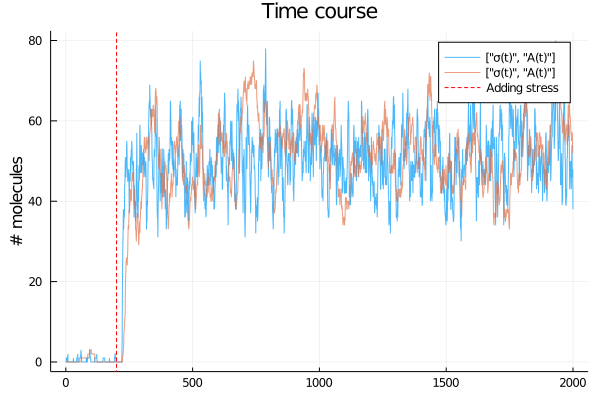

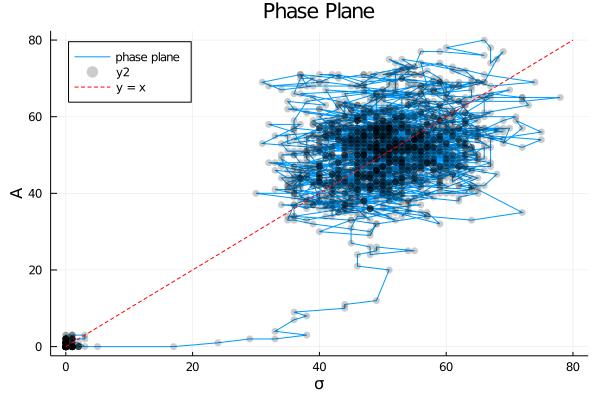

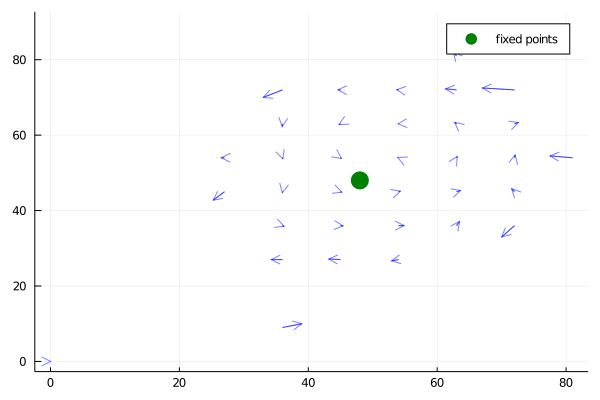

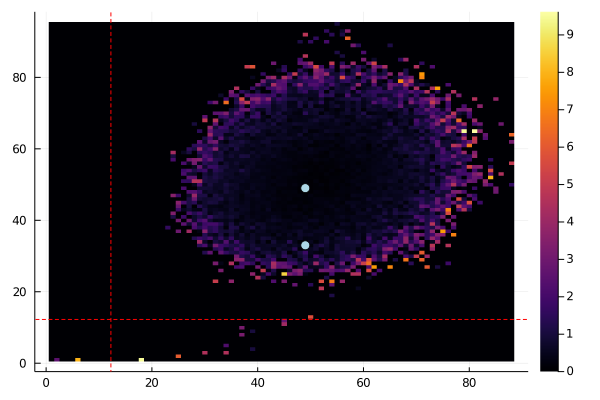

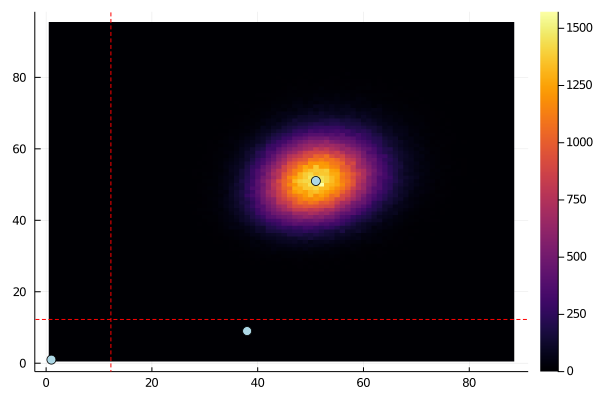

# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation
# 2


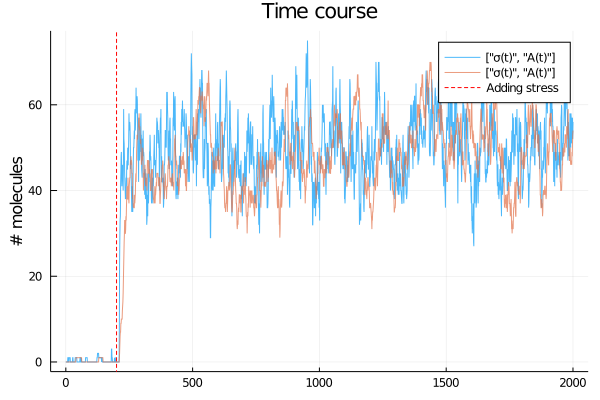

KD/KS = 43.6785200265154; KS = 1.25; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0

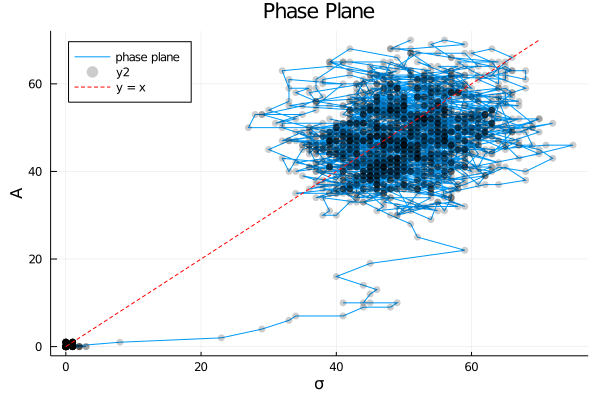

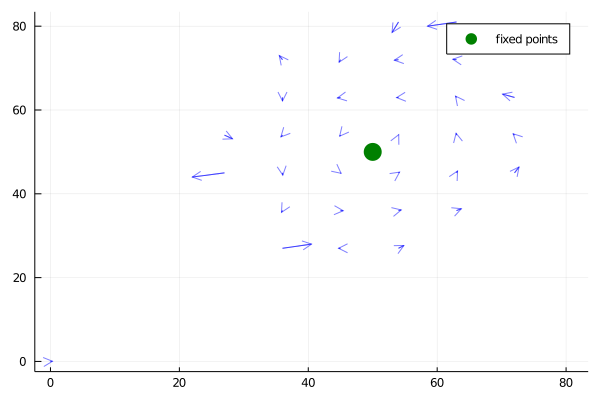

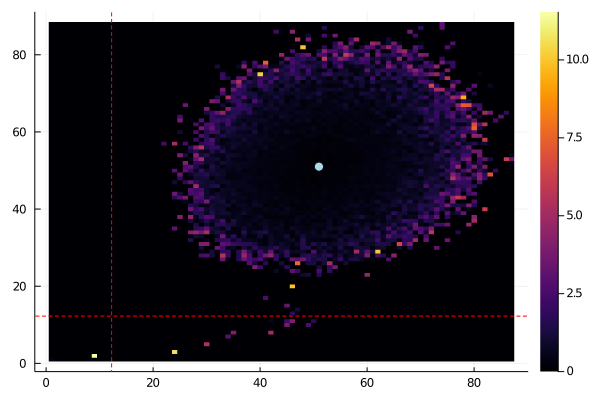

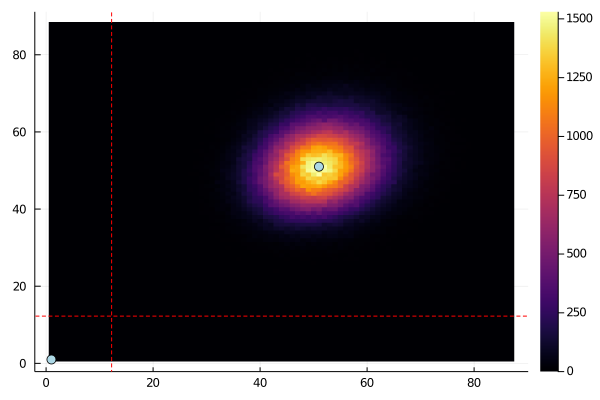

# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation
# 3


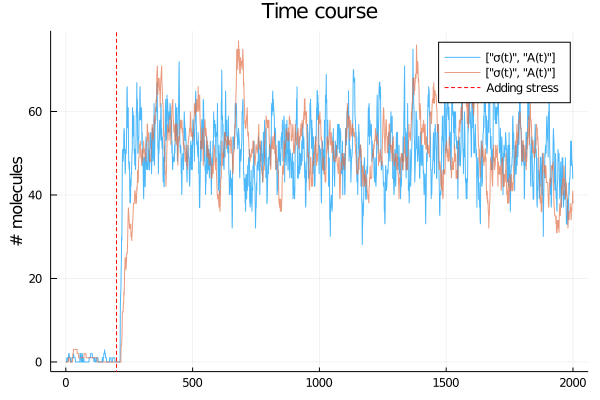

KD/KS = 16.068429538550134; KS = 1.25; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0


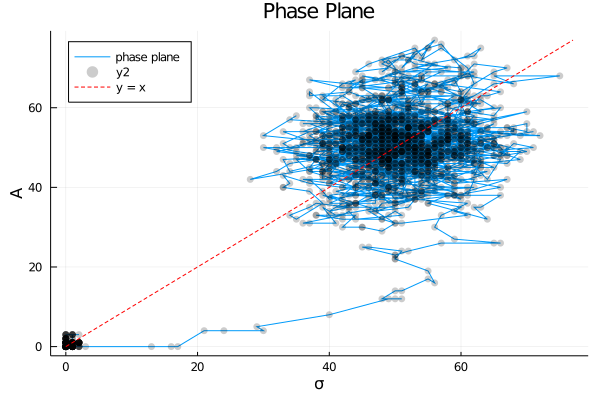

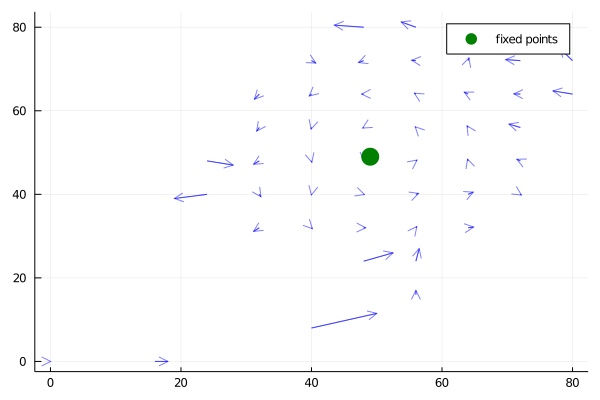

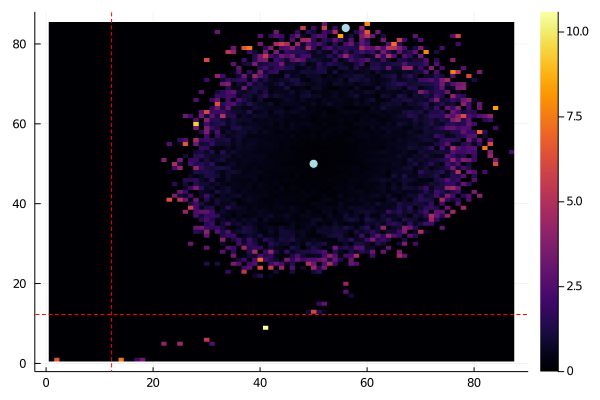

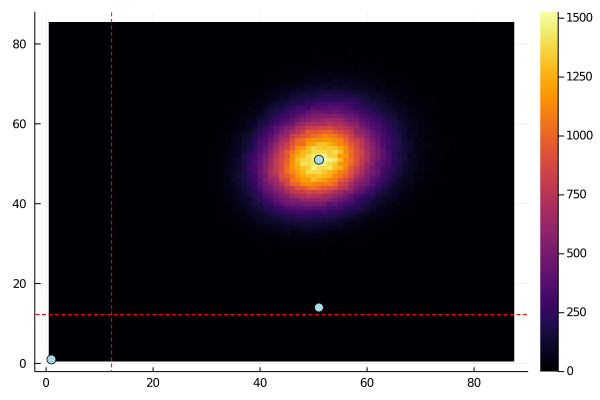


# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation
# 4


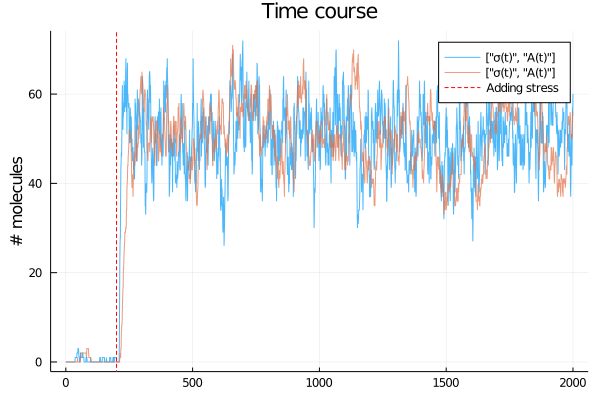

KD/KS = 5.91124487914452; KS = 1.25; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0


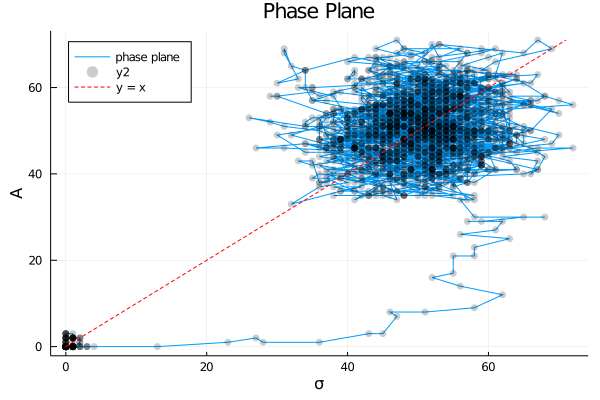

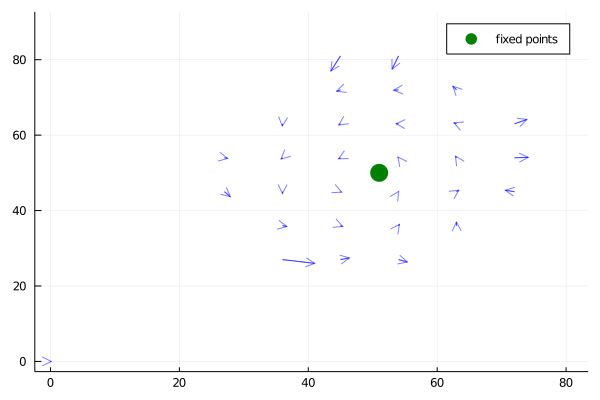

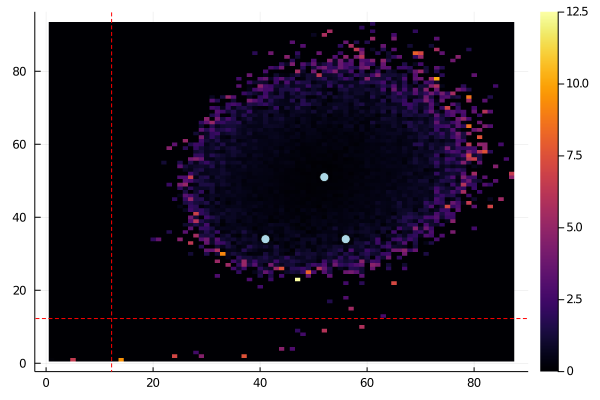

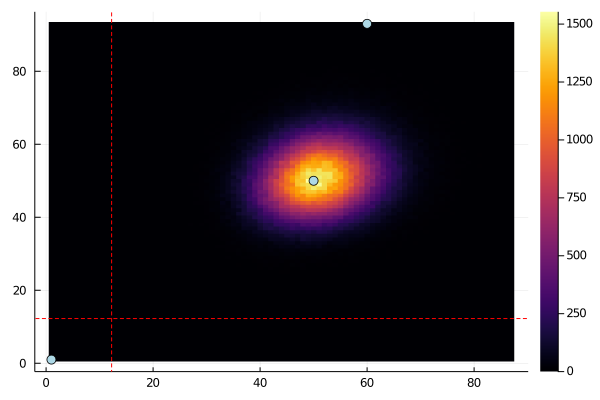

# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation
# 5


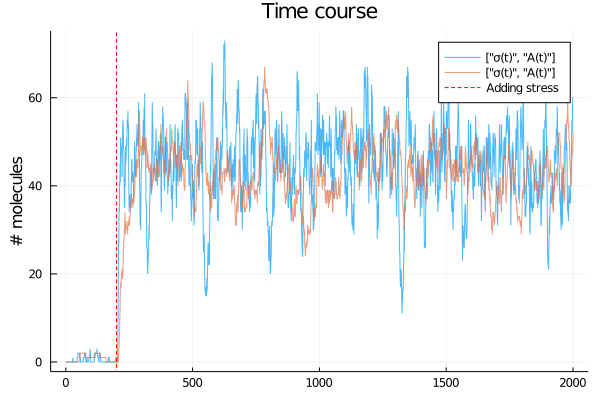

KD/KS = 2.1746254627672363; KS = 1.25; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0

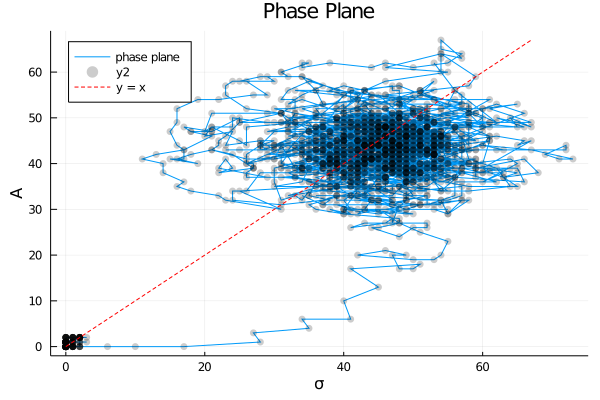

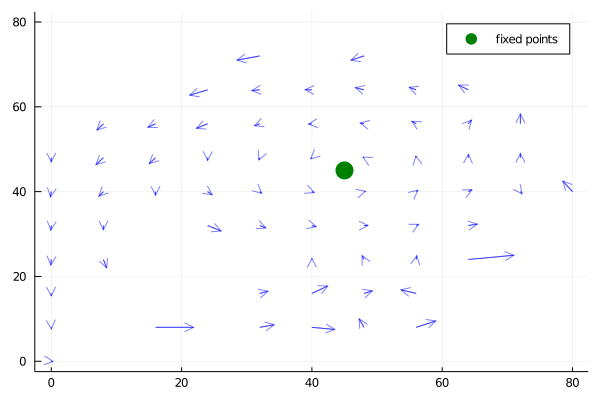

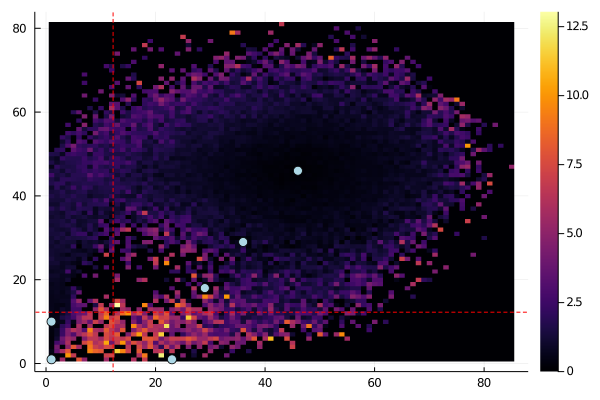

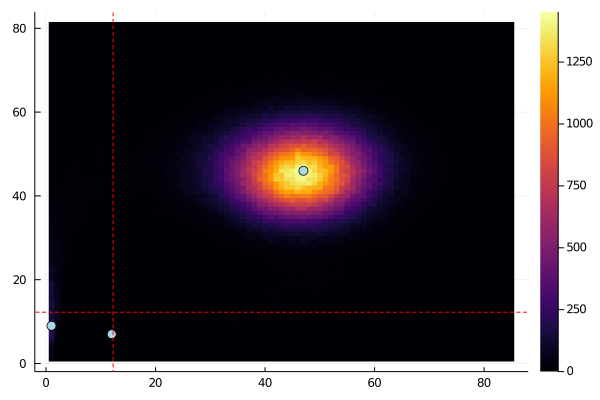


# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_anti_pulsing
# 6


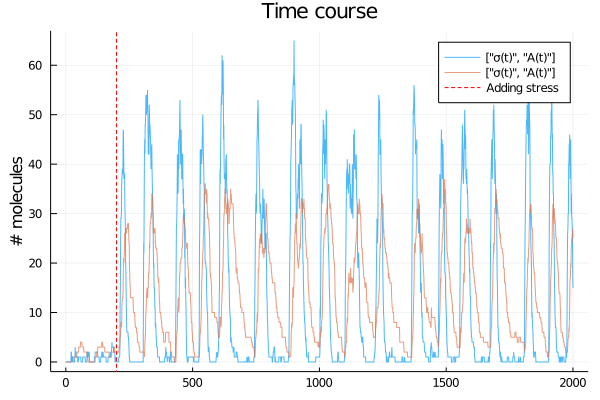

KD/KS = 0.8; KS = 1.25; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0

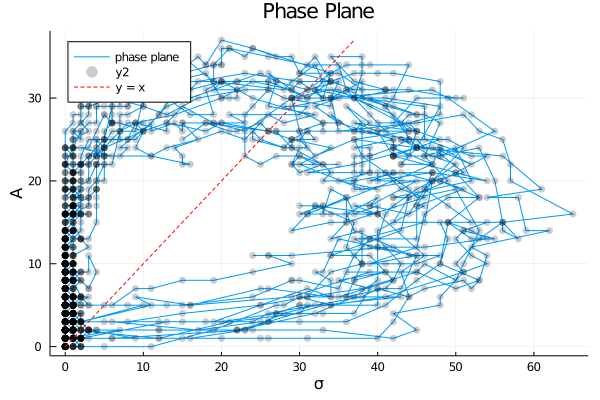

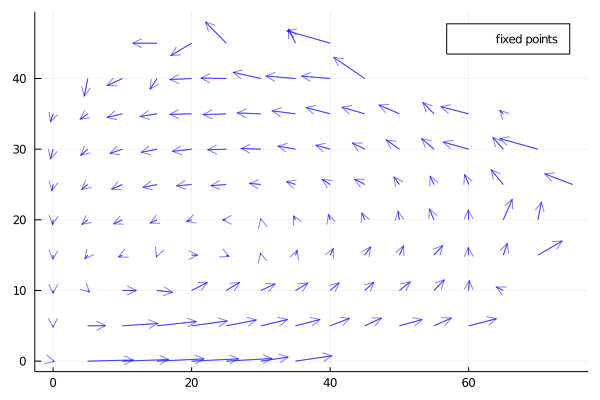

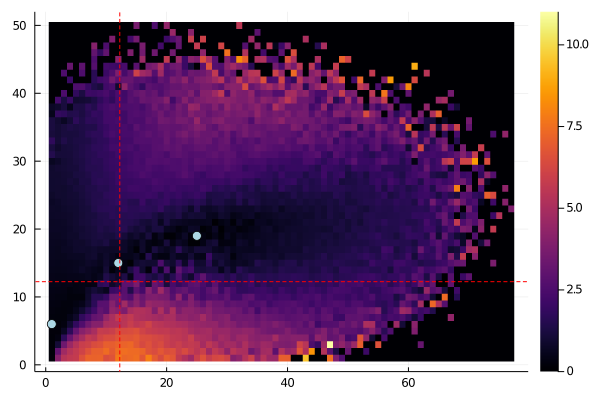

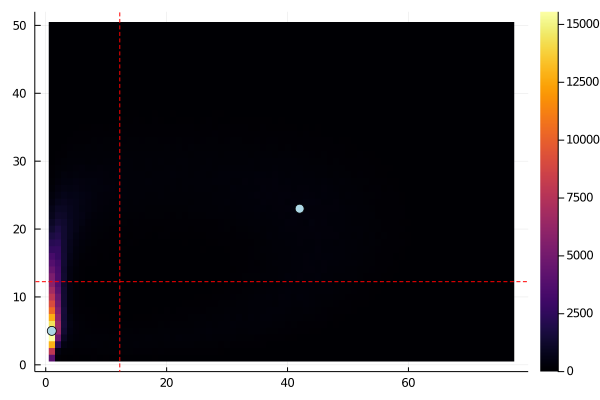


# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation
# 7


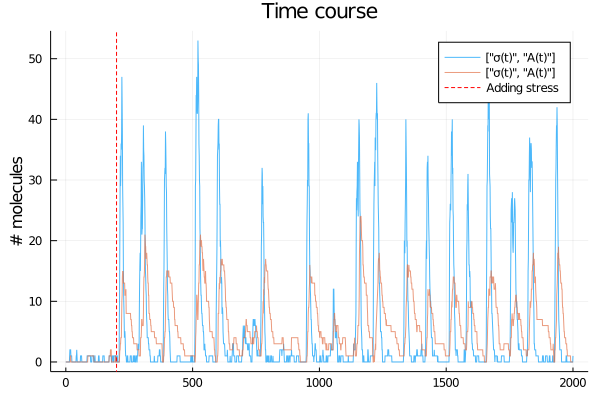

KD/KS = 0.2943035529371539; KS = 1.25; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0

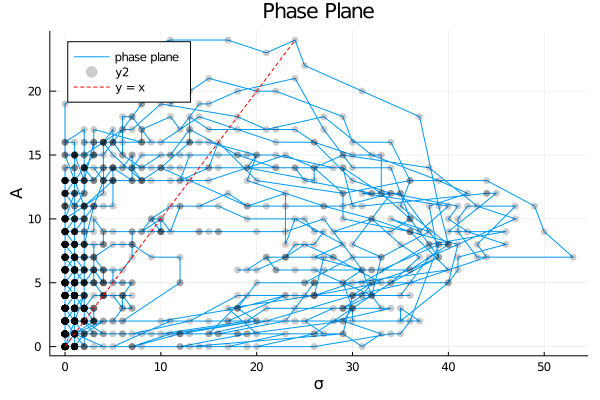

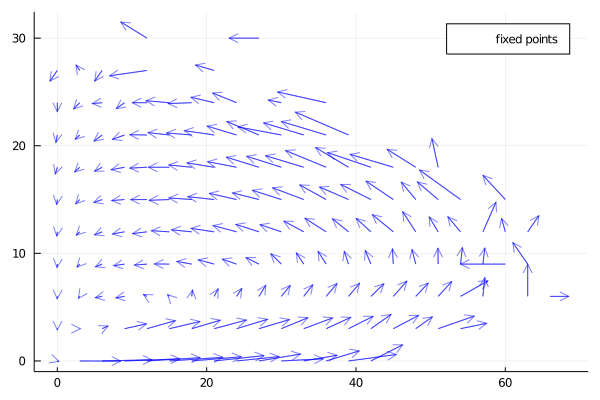

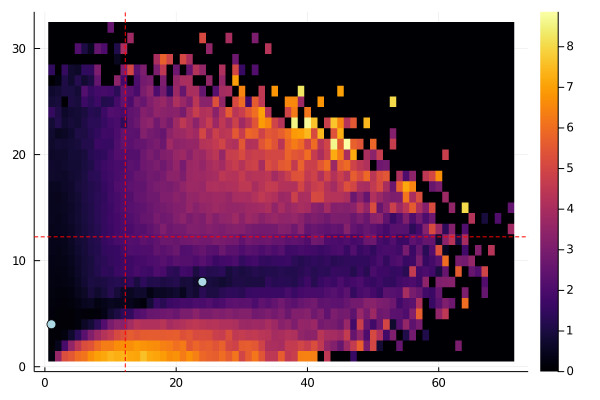

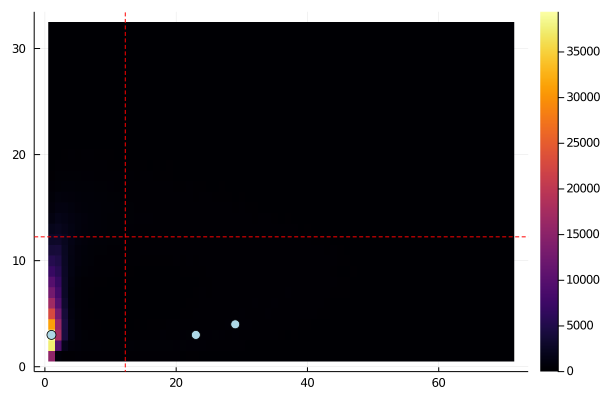


# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation
# 8


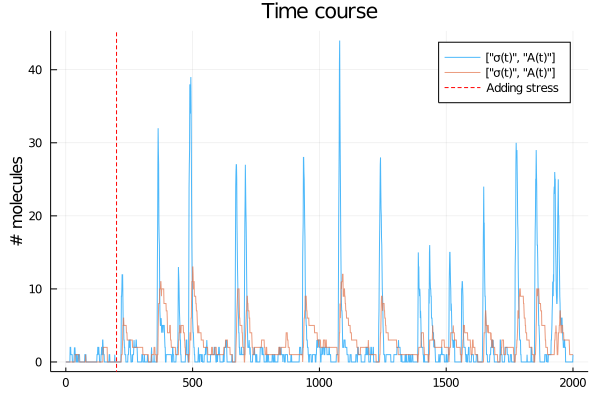

KD/KS = 0.10826822658929015; KS = 1.25; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0


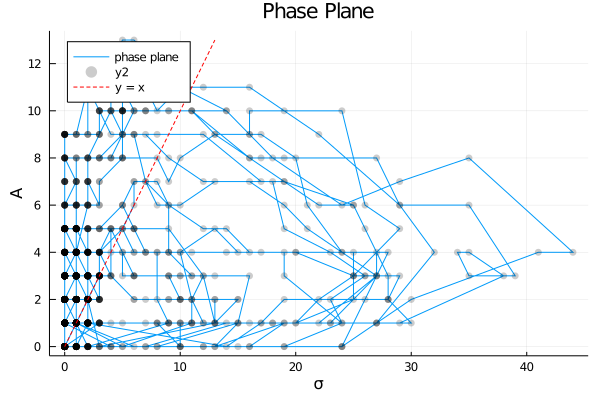

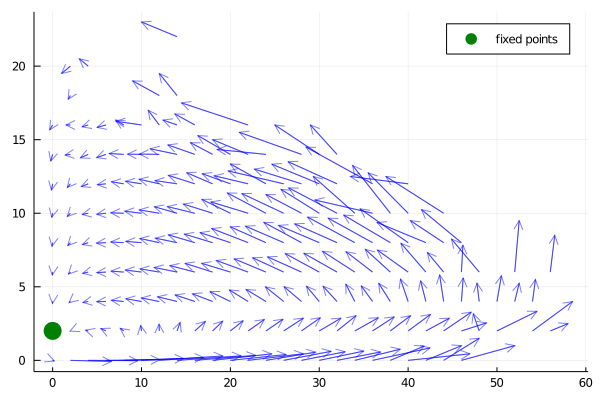

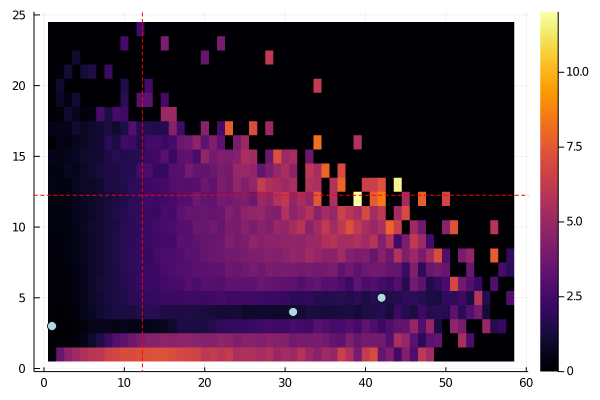

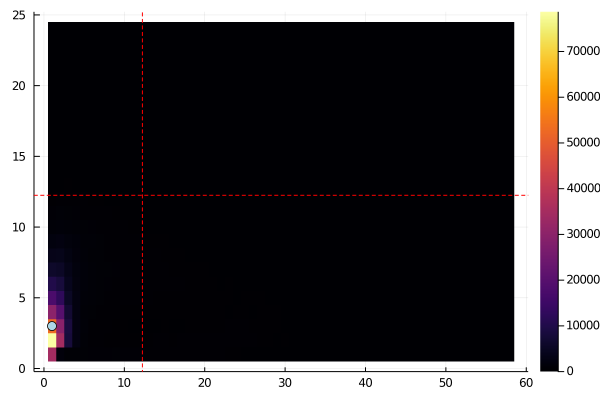

# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing
# 9


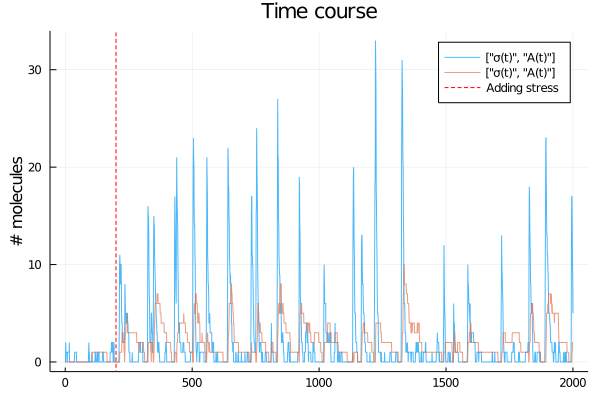

KD/KS = 0.03982965469429116; KS = 1.25; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0

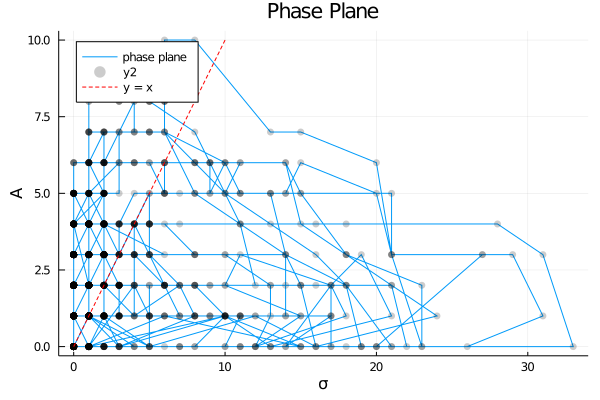

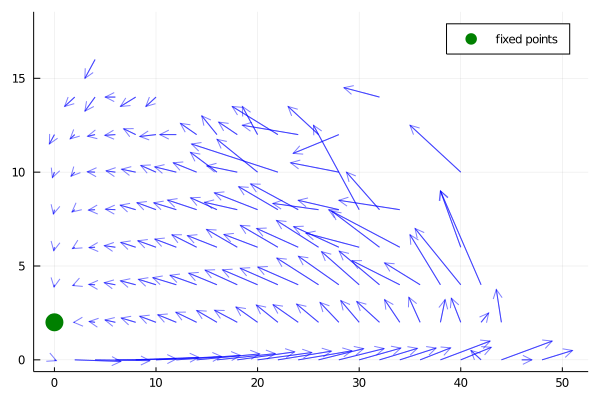

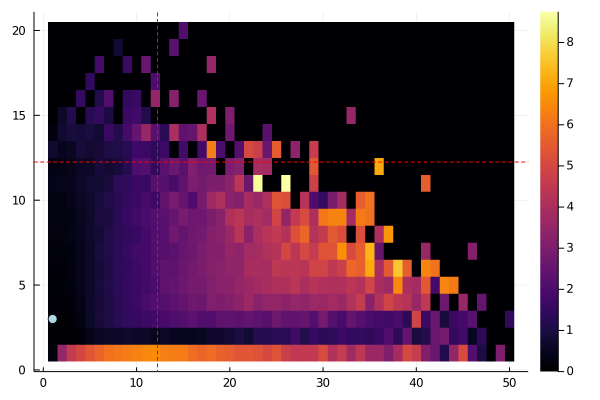

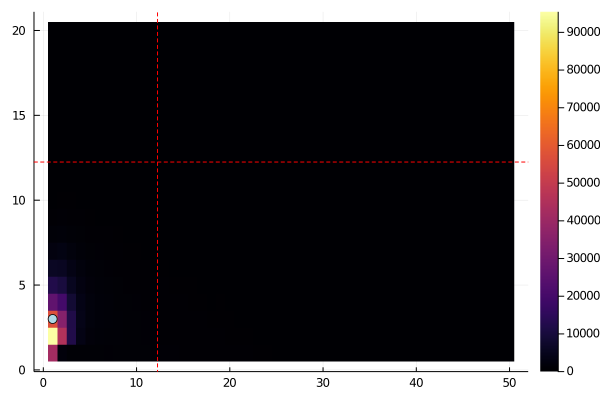

# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing
# 10


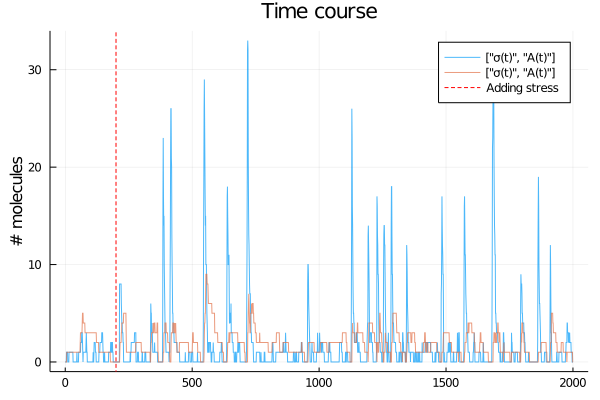

KD/KS = 0.014652511110987346; KS = 1.25; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0

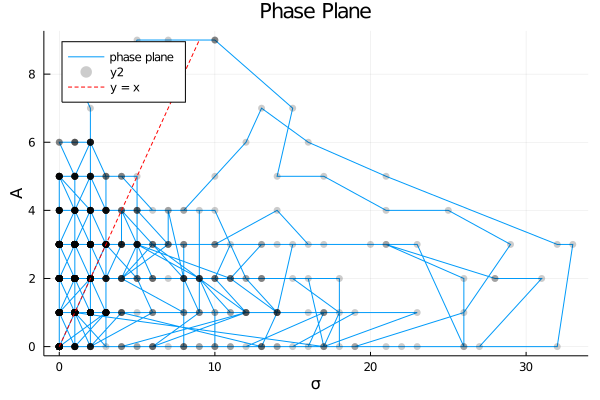

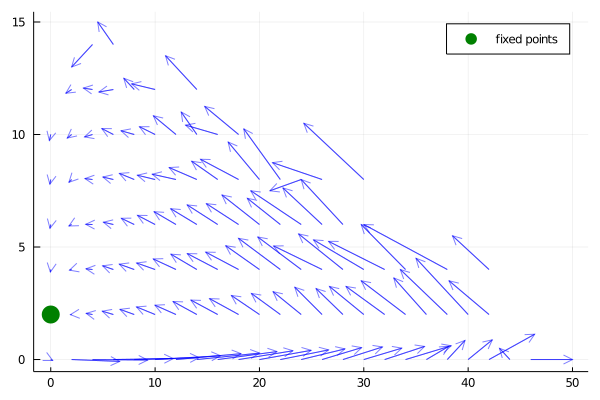

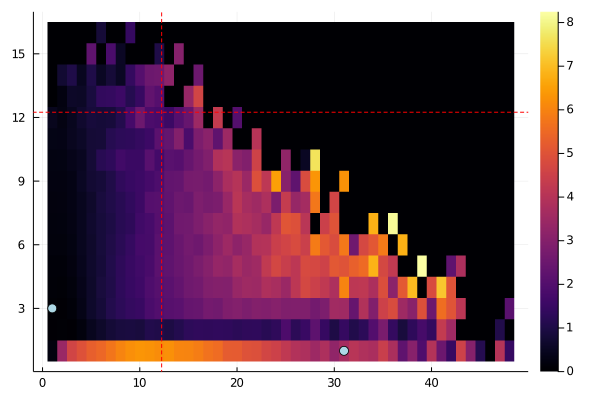

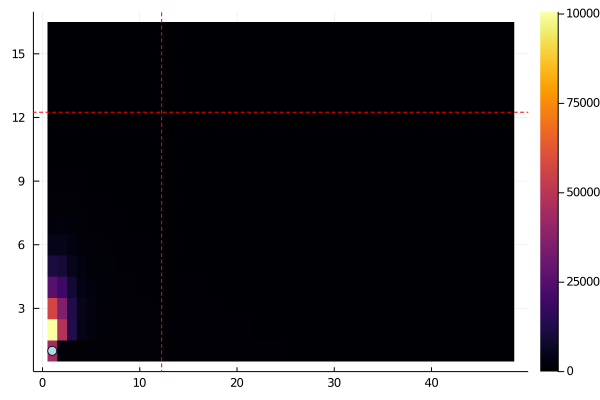

# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing


In [125]:
timescale = 5.0
timecourse = 5e5
β = 50.0
n = 3.0

sigma_model = reaction_system()

# S = rand() * 10.0    # randomize
# D = rand() * 10.0
# S = 1 / 15.099005900449596
# D = S / 0.03772334066581808
S = 0.8
i = 1
for D = exp.(range(-5, stop = 4, length = 10))
    println("# ", i)
    i += 1
    sol = simu_all(sigma_model, _KS = 1/S, _rK = S/D, _β = β, _τ₁ = timescale, _rτ = 5.0, _n = n, _η = 0.5,
        method = "ssa", show_hill = false, max_t = timecourse)

    regime = classify_by_timetraj(sol, 200.0, 1.0, β, n, thres_v = 0.002, thres_d = 1e-4, fluc_mult = 3, 
        show_vf_plot = true, show_v_heatmap = true, show_p_heatmap = true)
end

# 1


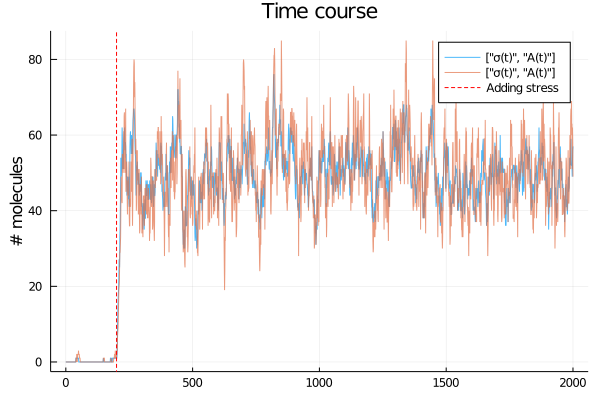

KD/KS = 148.4131591025766; KS = 1.0; τ₂/τ₁ = 0.2; β= 50.0; n = 3.0


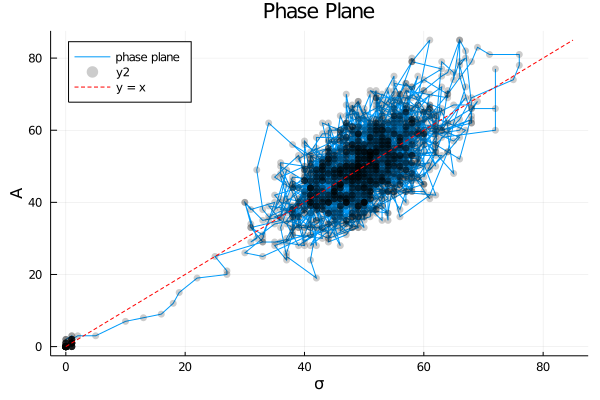

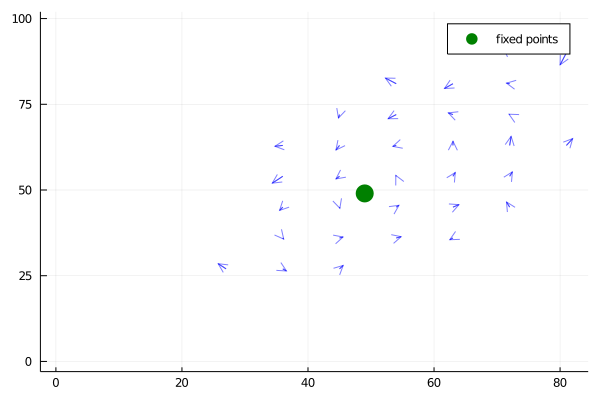

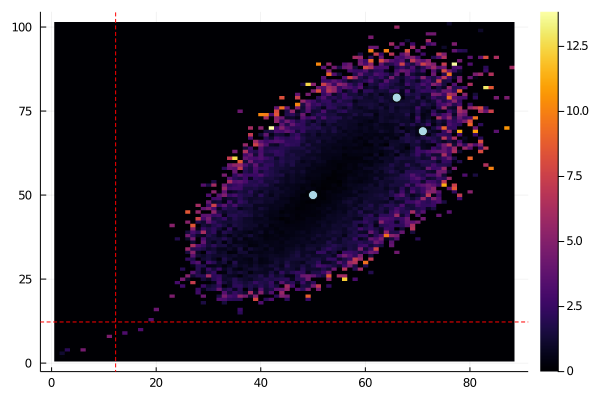

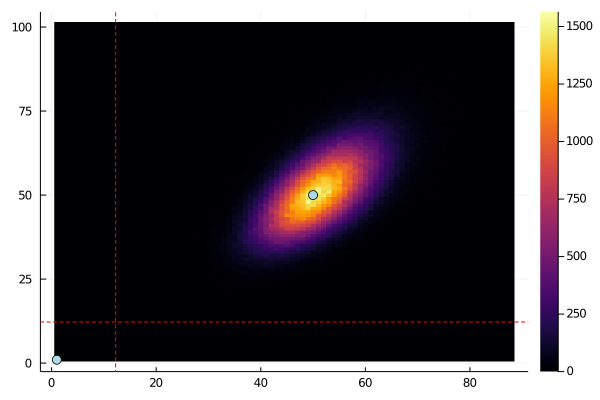


# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation
# 2

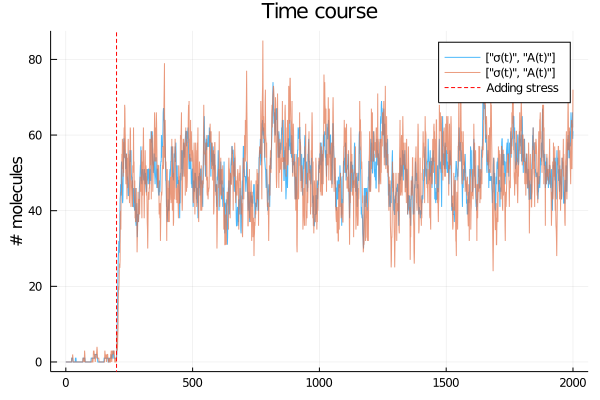


KD/KS = 54.59815003314424; KS = 1.0; τ₂/τ₁ = 0.2; β= 50.0; n = 3.0

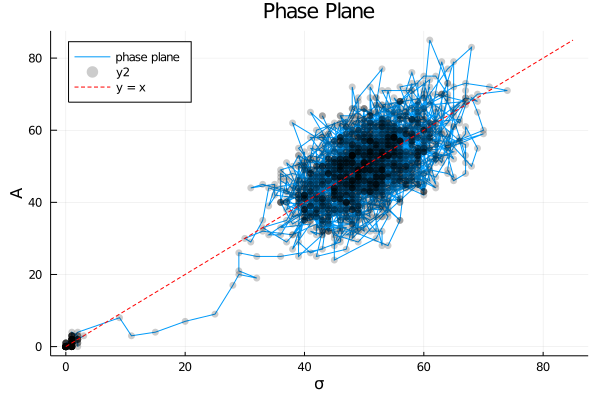

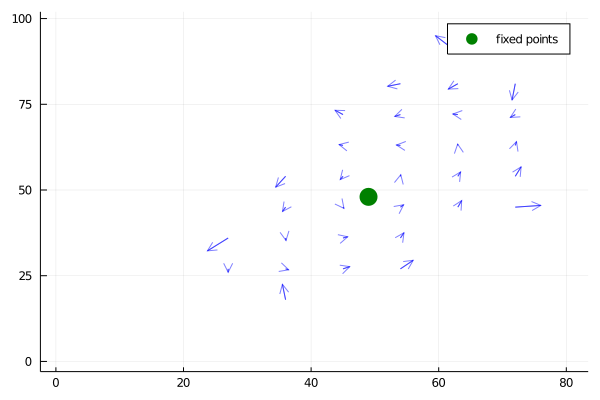

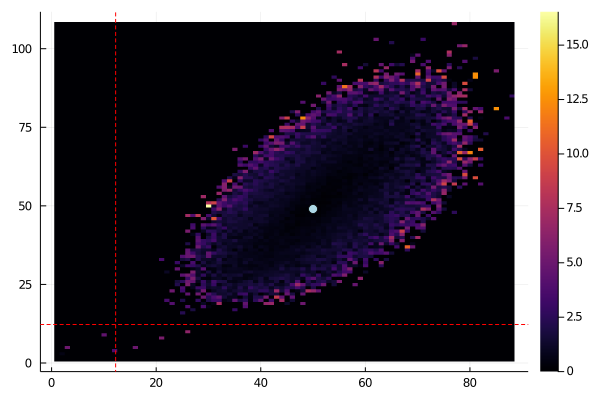

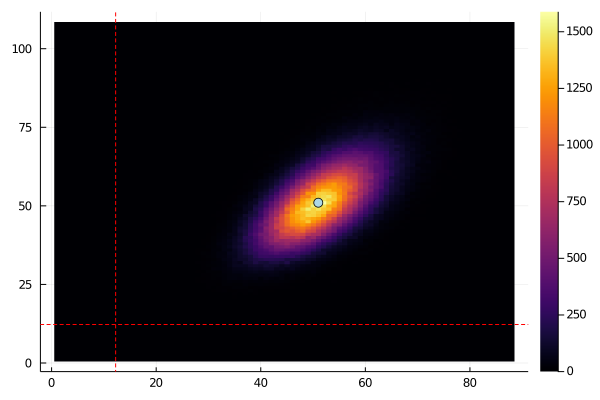

# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: true
The dynamical behaviour is: homo_activation
# 3

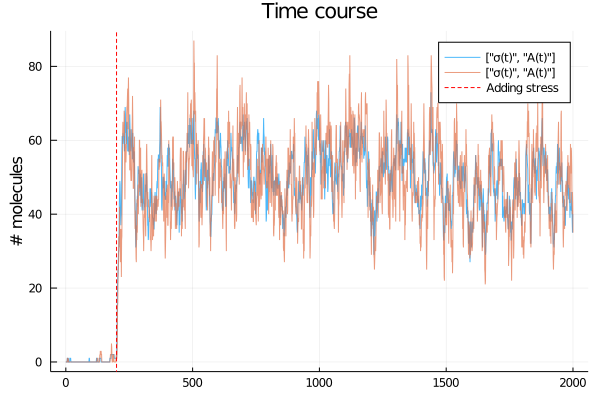


KD/KS = 20.085536923187668; KS = 1.0; τ₂/τ₁ = 0.2; β= 50.0; n = 3.0


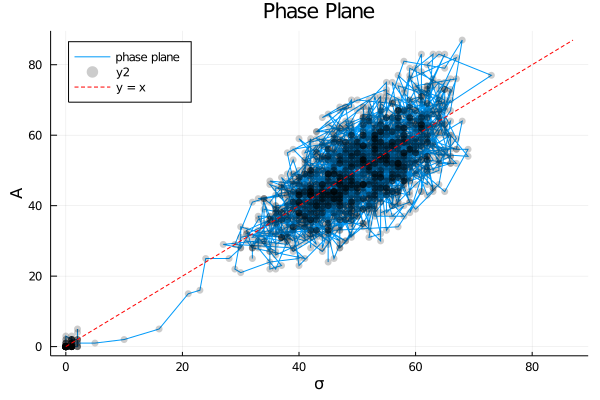

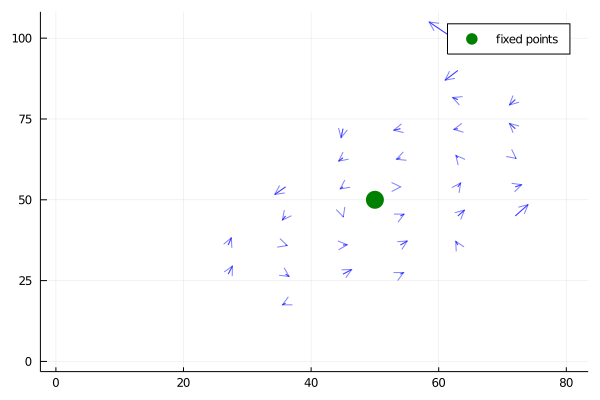

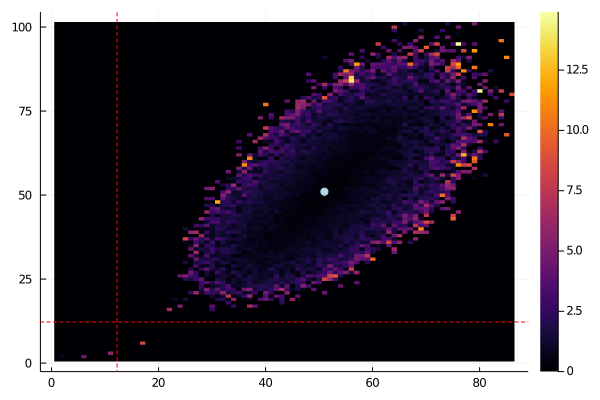

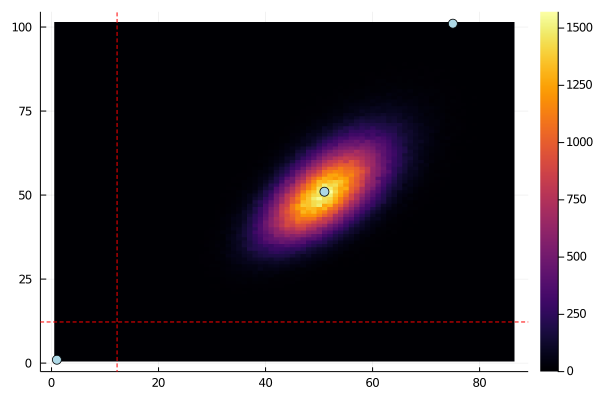


# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation
# 4


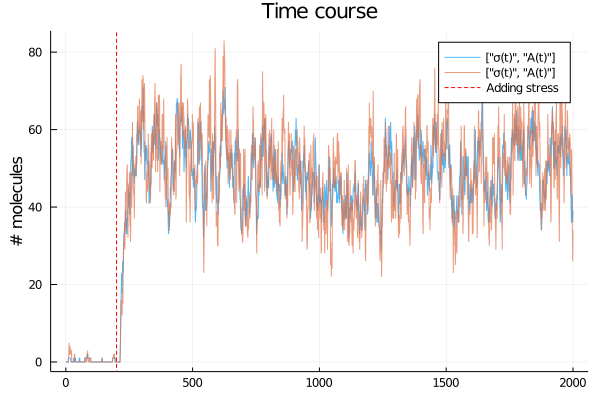

KD/KS = 7.3890560989306495; KS = 1.0; τ₂/τ₁ = 0.2; β= 50.0; n = 3.0


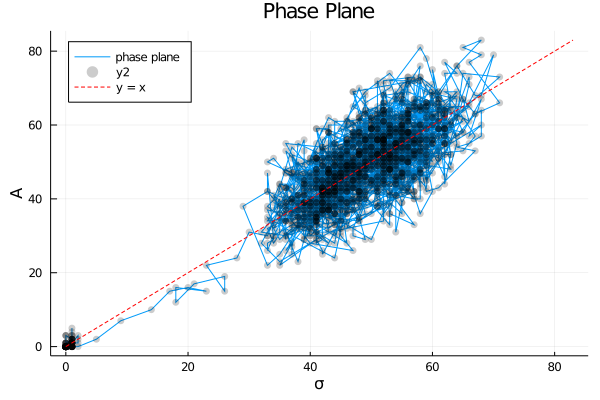

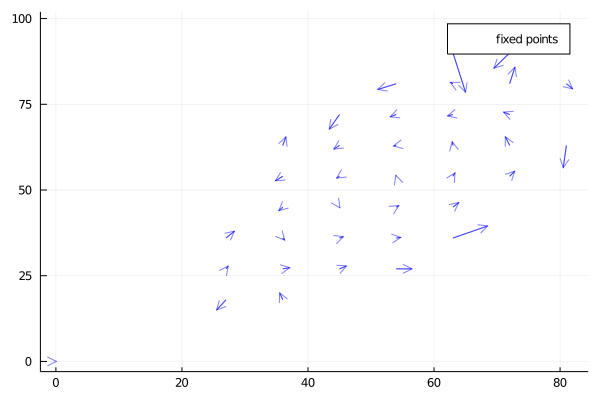

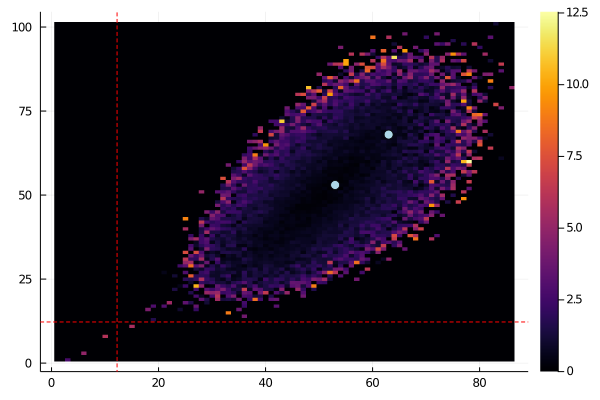

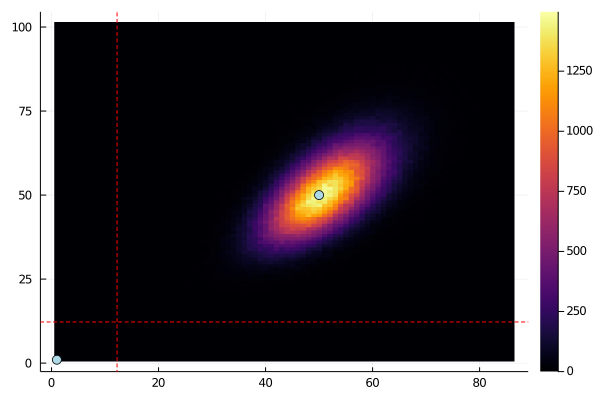


# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: false, has forward flow: false
The dynamical behaviour is: undefined
# 5


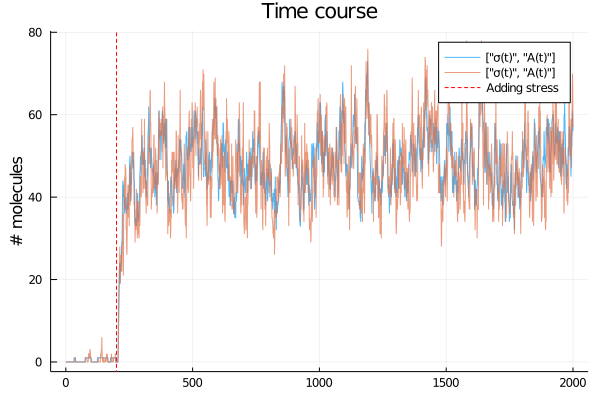

KD/KS = 2.718281828459045; KS = 1.0; τ₂/τ₁ = 0.2; β= 50.0; n = 3.0


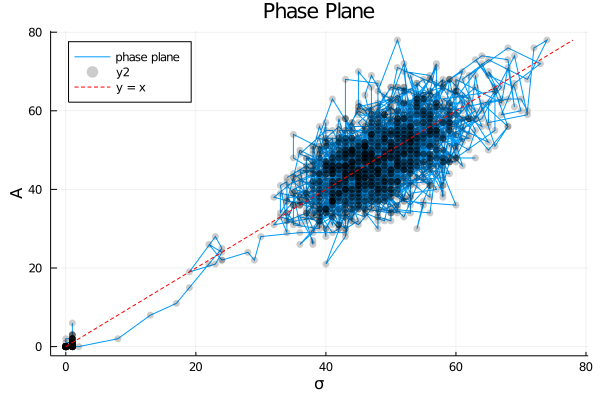

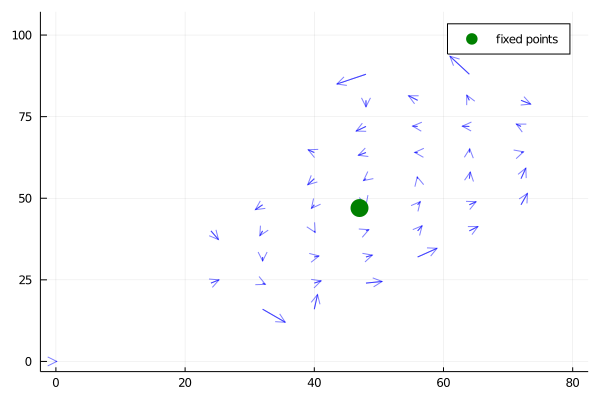

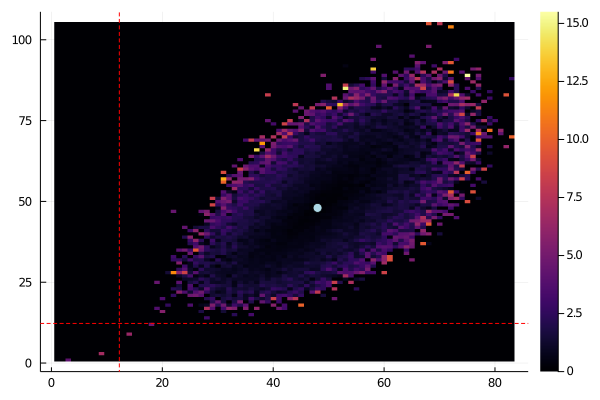

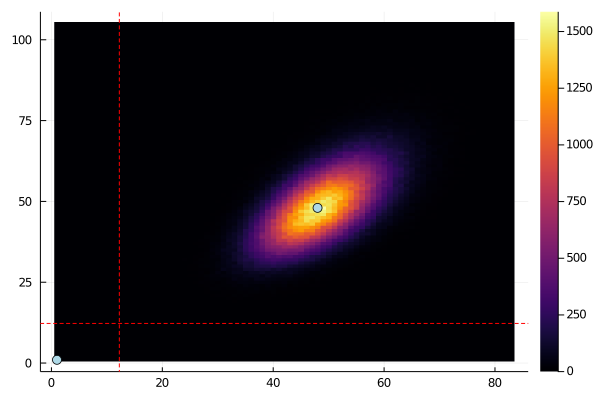


# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation
# 6

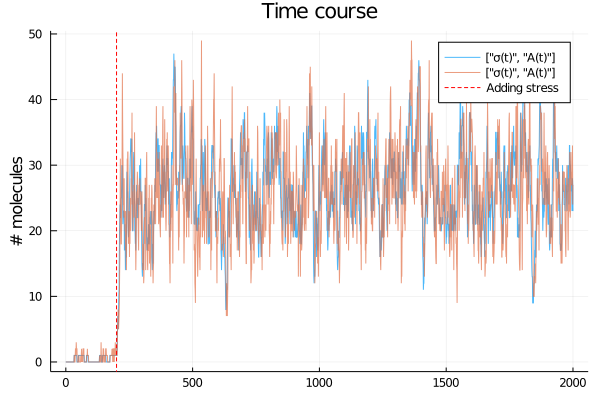


KD/KS = 1.0; KS = 1.0; τ₂/τ₁ = 0.2; β= 50.0; n = 3.0


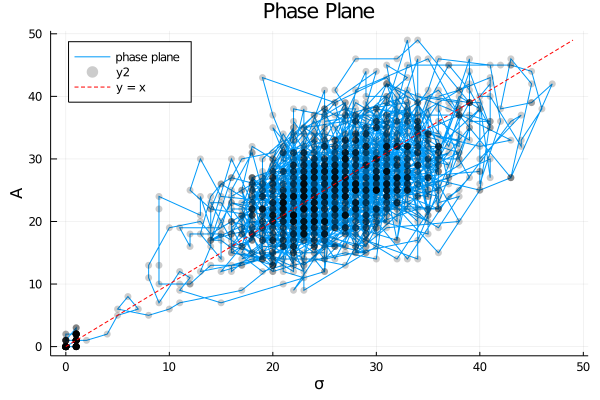

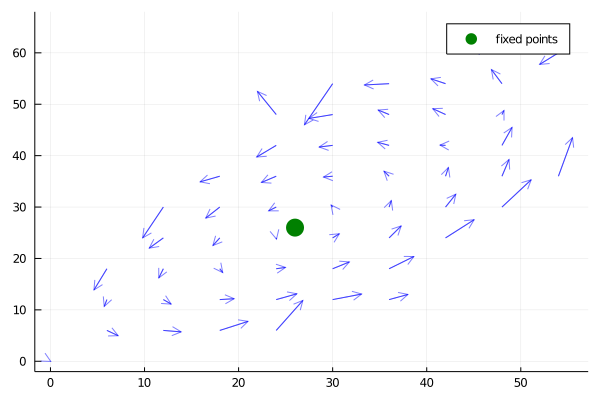

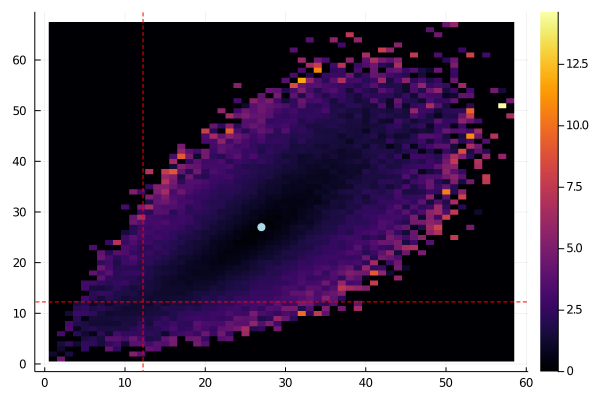

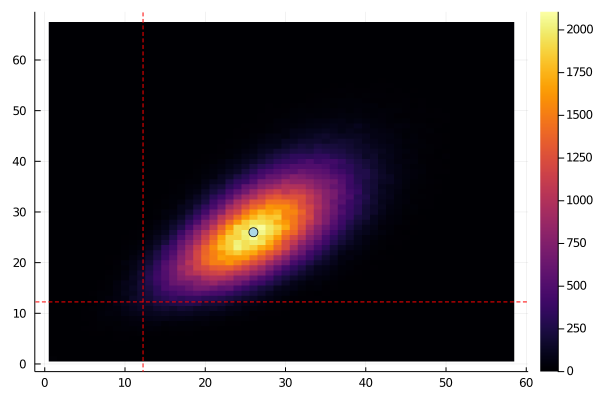

# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_anti_pulsing
# 7


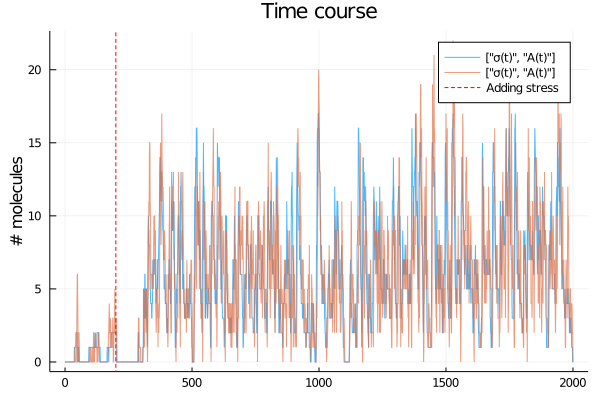

KD/KS = 0.36787944117144233; KS = 1.0; τ₂/τ₁ = 0.2; β= 50.0; n = 3.0


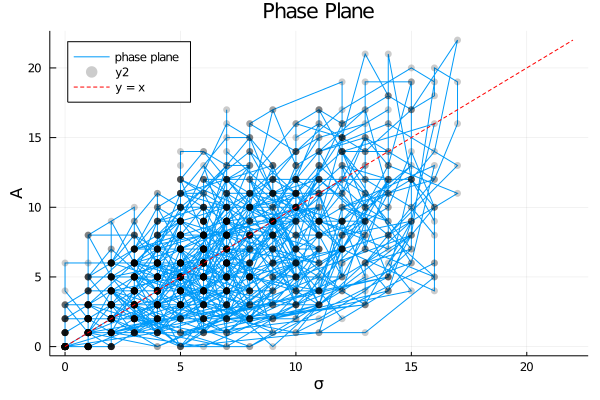

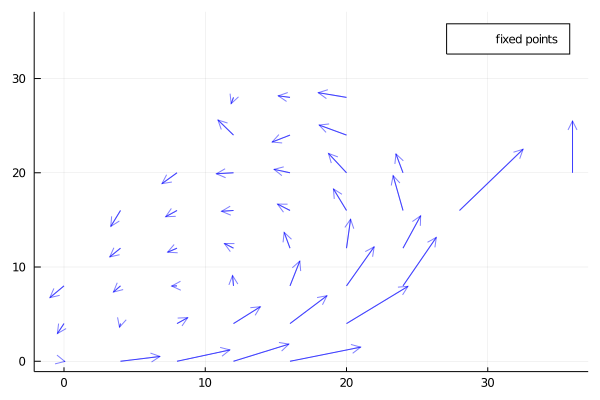

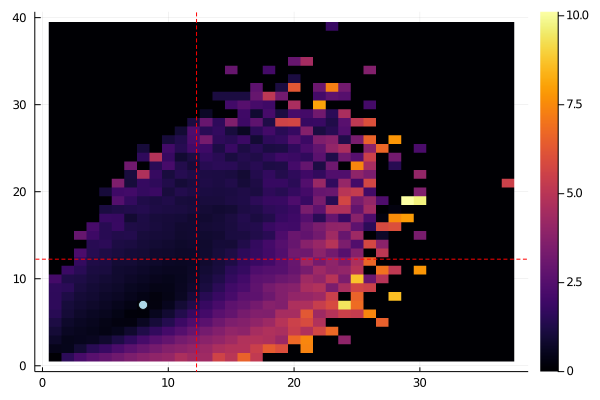

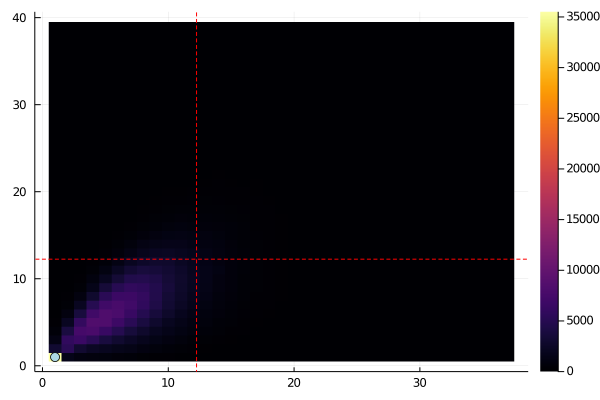


# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation
# 8
KD/KS = 0.1353352832366127; KS = 1.0; τ₂/τ₁ = 0.2; β= 50.0; n = 3.0


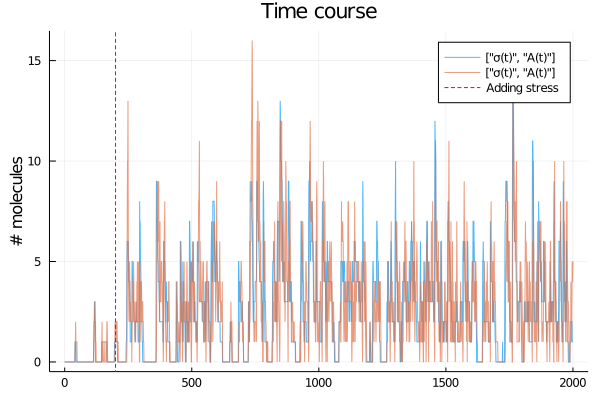

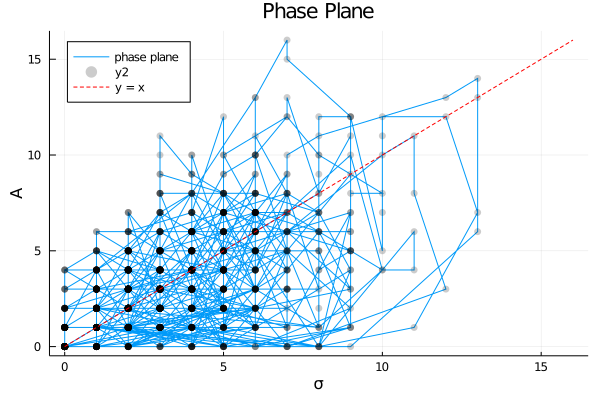

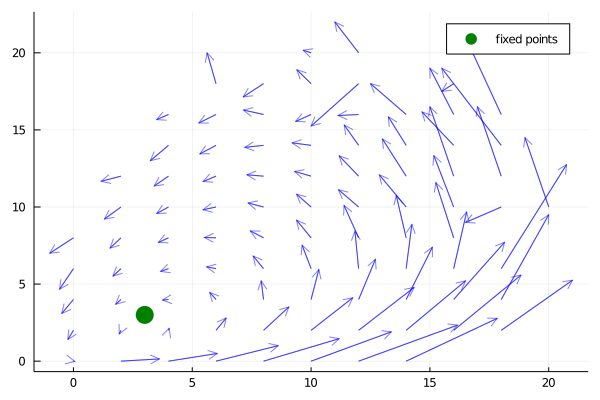

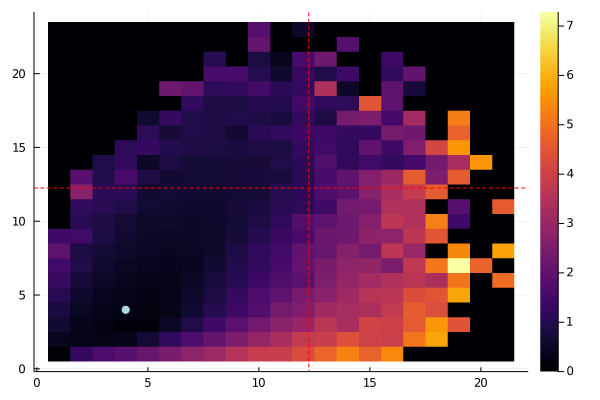

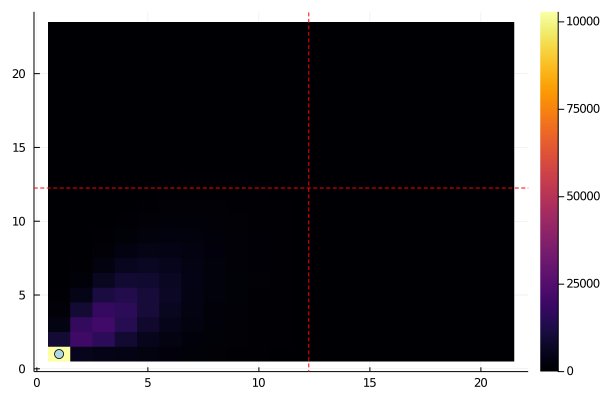

# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing
# 9


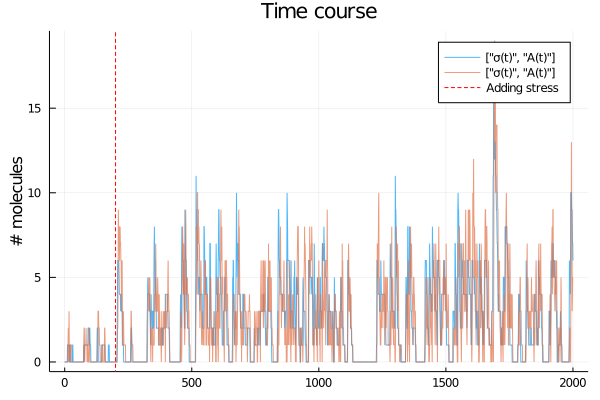

KD/KS = 0.049787068367863944; KS = 1.0; τ₂/τ₁ = 0.2; β= 50.0; n = 3.0


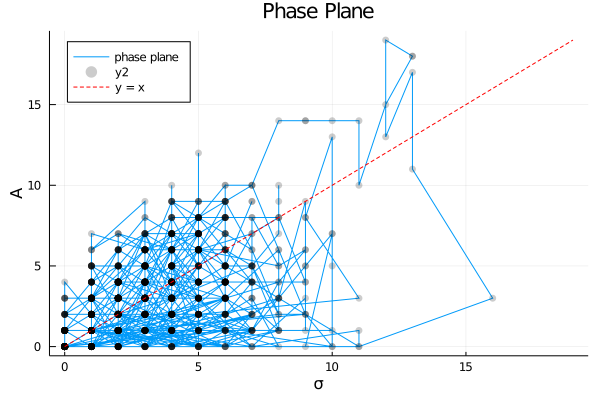

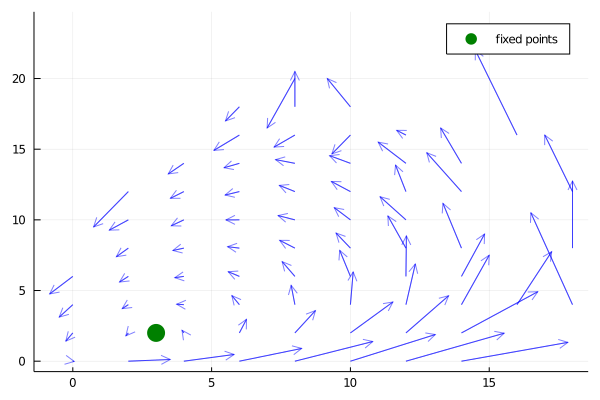

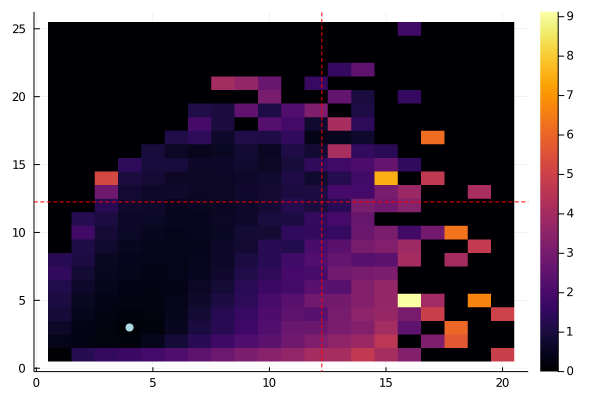

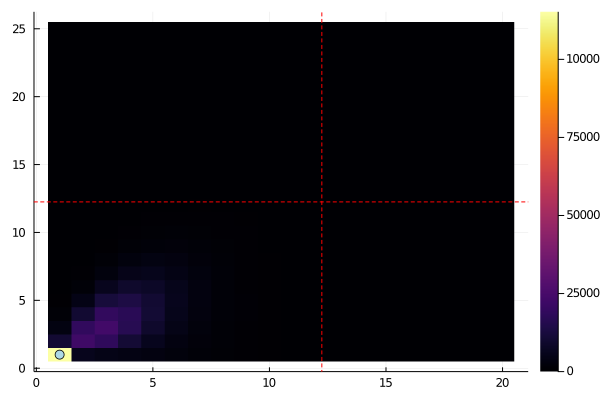


# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing
# 10

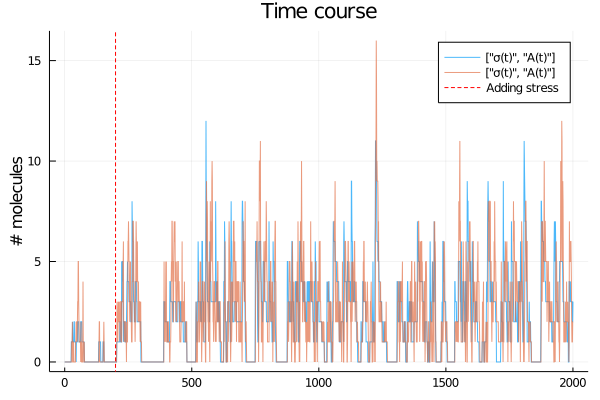


KD/KS = 0.018315638888734182; KS = 1.0; τ₂/τ₁ = 0.2; β= 50.0; n = 3.0

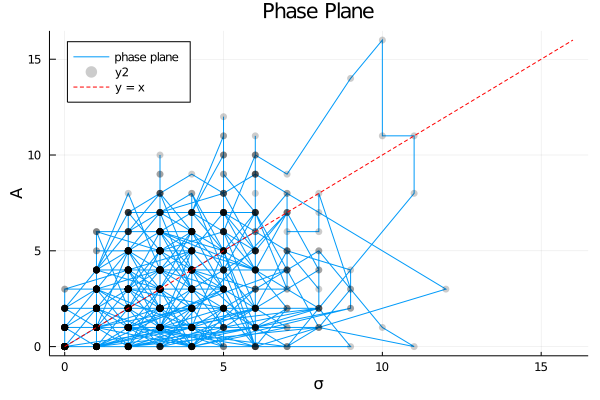

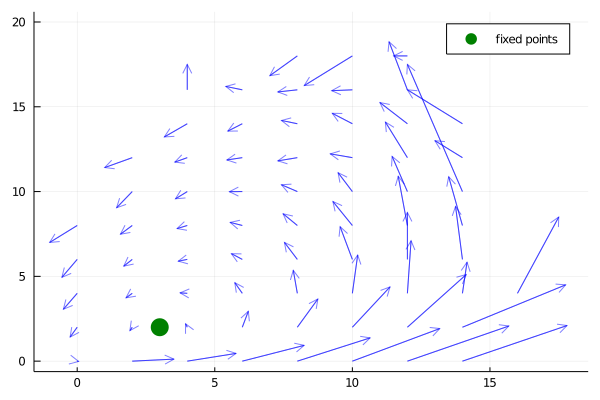

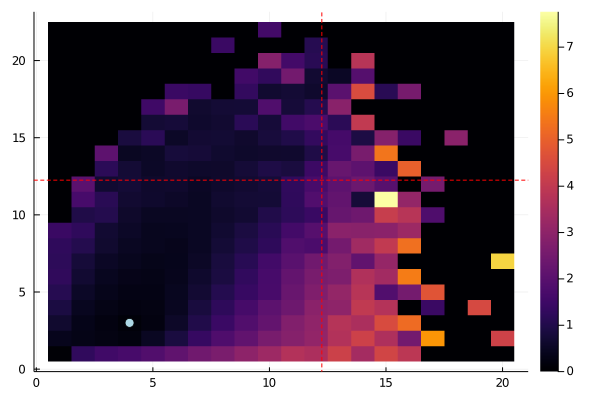

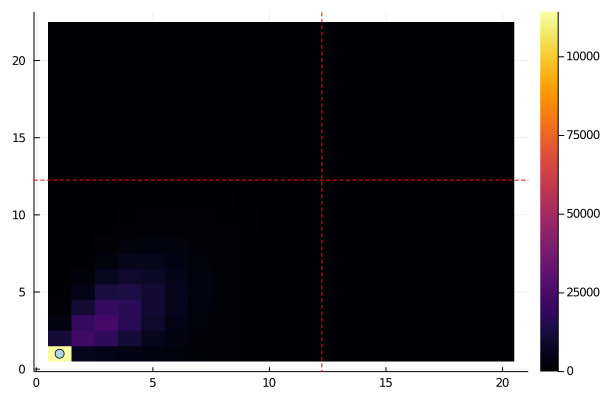


# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing


In [123]:
timescale = 10.0
timecourse = 5e5
β = 50.0
n = 3.0

sigma_model = reaction_system()

# S = rand() * 10.0    # randomize
# D = rand() * 10.0
# S = 1 / 15.099005900449596
# D = S / 0.03772334066581808
S = 1.0
i = 1
for D = exp.(range(-5, stop = 4, length = 10))
    println("# ", i)
    i += 1
    sol = simu_all(sigma_model, _KS = 1/S, _rK = S/D, _β = β, _τ₁ = timescale, _rτ = 0.2, _n = n, _η = 0.5,
        method = "ssa", show_hill = false, max_t = timecourse)

    regime = classify_by_timetraj(sol, 200.0, 1.0, β, n, thres_v = 0.005, thres_d = 1e-4, fluc_mult = 3, 
        show_vf_plot = true, show_v_heatmap = true, show_p_heatmap = true)
end

## Reproduce the (discrete) S-D map

Gillespie

In [16]:
timescale = 5.0
timecourse = 1e6    # for gillespie
β = 50.0
n = 3.0

sigma_model = reaction_system()

KS_vec = exp.(range(-5.0, stop = 5.0, length = 50))
rK_vec = exp.(range(-5.0, stop = 5.0, length = 50))
behaviors = Array{Symbol, 2}(undef, length(KS_vec), length(rK_vec))

for i in 1:length(KS_vec)
    for j in 1:length(rK_vec)
        println("\n# ", (i - 1) * length(rK_vec) + j)
#         println("S = ", S_vec[i], ", D = ", D_vec[j])
        println("KS = ", KS_vec[i], ", rK = ", rK_vec[j])
        
#       sol = simu_all(sigma_model, _KS = 1/S_vec[i], _rK = S_vec[i]/D_vec[j], _β = β, _τ₁ = timescale, _rτ = 0.2, _n = n, _η = 0.2, 
#                 show_hill = false, show_tc = false, show_pp = false, max_t = timecourse)
        sol = simu_all(sigma_model, _KS = KS_vec[i], _rK = rK_vec[j], _β = β, _τ₁ = timescale, _rτ = 5.0, _n = n, _η = 0.2, 
            show_hill = false, show_tc = false, show_pp = false, max_t = timecourse)
        ~, σ, A = interpret_sol(sol)
        b = classify_by_timetraj(sol, 200.0, 1.0, β, n, thres_v = 0.002)
        behaviors[i, j] = b
    end
end
display(behaviors)


# 1
KS = 0.006737946999085467, rK = 0.006737946999085467
KD/KS = 0.006737946999085467; KS = 0.006737946999085467; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 2
KS = 0.006737946999085467, rK = 0.008263406499327719
KD/KS = 0.008263406499327719; KS = 0.006737946999085467; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 3
KS = 0.006737946999085467, rK = 0.010134227381485734
KD/KS = 0.010134227381485734; KS = 0.006737946999085467; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 4
KS = 0.006737946999085467, rK = 0.012428598862710048
KD/KS = 0.012428598862710048; KS = 0

KD/KS = 0.018693267685999052; KS = 0.008263406499327719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 57
KS = 0.008263406499327719, rK = 0.022925391029511435
KD/KS = 0.022925391029511435; KS = 0.008263406499327719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 58
KS = 0.008263406499327719, rK = 0.028115659748972035
KD/KS = 0.028115659748972035; KS = 0.008263406499327719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 59
KS = 0.008263406499327719, rK = 0.03448099629368951
KD/KS = 0.03448099629368951; KS = 0.008263406499327719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 

KS = 0.008263406499327719, rK = 5.667192683335804
KD/KS = 5.667192683335804; KS = 0.008263406499327719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 85
KS = 0.008263406499327719, rK = 6.950235265842222
KD/KS = 6.950235265842222; KS = 0.008263406499327719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 86
KS = 0.008263406499327719, rK = 8.5237564610426
KD/KS = 8.5237564610426; KS = 0.008263406499327719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 87
KS = 0.008263406499327719, rK = 10.453520122438803
KD/KS = 10.453520122438803; KS = 0.008263406499327719; τ₂/τ₁ = 5.

# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 112
KS = 0.010134227381485734, rK = 0.0636025292836268
KD/KS = 0.0636025292836268; KS = 0.010134227381485734; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 113
KS = 0.010134227381485734, rK = 0.07800203146853764
KD/KS = 0.07800203146853764; KS = 0.010134227381485734; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 114
KS = 0.010134227381485734, rK = 0.0956615559435782
KD/KS = 0.0956615559435782; KS = 0.010134227381485734; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward

KS = 0.010134227381485734, rK = 15.722645172499927
KD/KS = 15.722645172499927; KS = 0.010134227381485734; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 140
KS = 0.010134227381485734, rK = 19.282224737400533
KD/KS = 19.282224737400533; KS = 0.010134227381485734; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 141
KS = 0.010134227381485734, rK = 23.647686934634528
KD/KS = 23.647686934634528; KS = 0.010134227381485734; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 142
KS = 0.010134227381485734, rK = 29.001482192758264
KD/KS = 29.001482192758264; KS = 0.01013422738148573

KD/KS = 43.61975761777491; KS = 0.012428598862710048; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 195
KS = 0.012428598862710048, rK = 53.49519499734032
KD/KS = 53.49519499734032; KS = 0.012428598862710048; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 196
KS = 0.012428598862710048, rK = 65.60641425108047
KD/KS = 65.60641425108047; KS = 0.012428598862710048; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 197
KS = 0.012428598862710048, rK = 80.45959251290459
KD/KS = 80.45959251290459; KS = 0.012428598862710048; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise

# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 222
KS = 0.015242412063139558, rK = 0.4895416595569531
KD/KS = 0.4895416595569531; KS = 0.015242412063139558; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 223
KS = 0.015242412063139558, rK = 0.6003730411984044
KD/KS = 0.6003730411984044; KS = 0.015242412063139558; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 224
KS = 0.015242412063139558, rK = 0.7362964551863367
KD/KS = 0.7362964551863367; KS = 0.015242412063139558; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamic

# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 277
KS = 0.018693267685999052, rK = 1.358148600276674
KD/KS = 1.358148600276674; KS = 0.018693267685999052; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 278
KS = 0.018693267685999052, rK = 1.6656310849732698
KD/KS = 1.6656310849732698; KS = 0.018693267685999052; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_anti_pulsing

# 279
KS = 0.018693267685999052, rK = 2.042727070266142
KD/KS = 2.042727070266142; KS = 0.018693267685999052; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The

KS = 0.022925391029511435, rK = 0.012428598862710048
KD/KS = 0.012428598862710048; KS = 0.022925391029511435; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 305
KS = 0.022925391029511435, rK = 0.015242412063139558
KD/KS = 0.015242412063139558; KS = 0.022925391029511435; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 306
KS = 0.022925391029511435, rK = 0.018693267685999052
KD/KS = 0.018693267685999052; KS = 0.022925391029511435; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 307
KS = 0.022925391029511435, rK = 0.022925391029511435
KD/KS = 0.022925391029511435; KS = 

KD/KS = 0.03448099629368951; KS = 0.028115659748972035; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 360
KS = 0.028115659748972035, rK = 0.04228743397881315
KD/KS = 0.04228743397881315; KS = 0.028115659748972035; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 361
KS = 0.028115659748972035, rK = 0.05186123560007898
KD/KS = 0.05186123560007898; KS = 0.028115659748972035; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 362
KS = 0.028115659748972035, rK = 0.0636025292836268
KD/KS = 0.0636025292836268; KS = 0.028115659748972035; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, #

KS = 0.028115659748972035, rK = 10.453520122438803
KD/KS = 10.453520122438803; KS = 0.028115659748972035; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 388
KS = 0.028115659748972035, rK = 12.820178925767504
KD/KS = 12.820178925767504; KS = 0.028115659748972035; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 389
KS = 0.028115659748972035, rK = 15.722645172499927
KD/KS = 15.722645172499927; KS = 0.028115659748972035; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 390
KS = 0.028115659748972035, rK = 19.282224737400533
KD/KS = 19.282224737400533; KS = 0.02811565974897203

# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 415
KS = 0.03448099629368951, rK = 0.11731916609425078
KD/KS = 0.11731916609425078; KS = 0.03448099629368951; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 416
KS = 0.03448099629368951, rK = 0.1438800215748986
KD/KS = 0.1438800215748986; KS = 0.03448099629368951; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 417
KS = 0.03448099629368951, rK = 0.17645420861381111
KD/KS = 0.17645420861381111; KS = 0.03448099629368951; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flo

# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 443
KS = 0.03448099629368951, rK = 35.567367400530664
KD/KS = 35.567367400530664; KS = 0.03448099629368951; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 444
KS = 0.03448099629368951, rK = 43.61975761777491
KD/KS = 43.61975761777491; KS = 0.03448099629368951; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: false, has forward flow: true
The dynamical behaviour is: homo_activation

# 445
KS = 0.03448099629368951, rK = 53.49519499734032
KD/KS = 53.49519499734032; KS = 0.03448099629368951; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: false, has forward flow: false
Th

KD/KS = 0.325481719698252; KS = 0.04228743397881315; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 471
KS = 0.04228743397881315, rK = 0.3991702158434836
KD/KS = 0.3991702158434836; KS = 0.04228743397881315; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 472
KS = 0.04228743397881315, rK = 0.4895416595569531
KD/KS = 0.4895416595569531; KS = 0.04228743397881315; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 473
KS = 0.04228743397881315, rK = 0.6003730411984044
KD/KS = 0.6003730411984044; KS = 0.04228743397881315; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp abo

KD/KS = 98.67550454086953; KS = 0.04228743397881315; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 499
KS = 0.04228743397881315, rK = 121.01546742028926
KD/KS = 121.01546742028926; KS = 0.04228743397881315; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 500
KS = 0.04228743397881315, rK = 148.4131591025766
KD/KS = 148.4131591025766; KS = 0.04228743397881315; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 501
KS = 0.05186123560007898, rK = 0.006737946999085467
KD/KS = 0.006737946999085467; KS = 0.05186123560007898; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below nois

KD/KS = 1.1074286719757578; KS = 0.05186123560007898; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 527
KS = 0.05186123560007898, rK = 1.358148600276674
KD/KS = 1.358148600276674; KS = 0.05186123560007898; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 528
KS = 0.05186123560007898, rK = 1.6656310849732698
KD/KS = 1.6656310849732698; KS = 0.05186123560007898; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 529
KS = 0.05186123560007898, rK = 2.042727070266142
KD/KS = 2.042727070266142; KS = 0.05186123560007898; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above 

KS = 0.0636025292836268, rK = 0.012428598862710048
KD/KS = 0.012428598862710048; KS = 0.0636025292836268; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 555
KS = 0.0636025292836268, rK = 0.015242412063139558
KD/KS = 0.015242412063139558; KS = 0.0636025292836268; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 556
KS = 0.0636025292836268, rK = 0.018693267685999052
KD/KS = 0.018693267685999052; KS = 0.0636025292836268; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 557
KS = 0.0636025292836268, rK = 0.022925391029511435
KD/KS = 0.022925391029511435; KS = 0.063602529283

KS = 0.0636025292836268, rK = 3.7679482111958893
KD/KS = 3.7679482111958893; KS = 0.0636025292836268; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 583
KS = 0.0636025292836268, rK = 4.621005143221286
KD/KS = 4.621005143221286; KS = 0.0636025292836268; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 584
KS = 0.0636025292836268, rK = 5.667192683335804
KD/KS = 5.667192683335804; KS = 0.0636025292836268; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 585
KS = 0.0636025292836268, rK = 6.950235265842222
KD/KS = 6.950235265842222; KS = 0.0636025292836268; τ₂/τ₁ = 5.0; β= 50.

KD/KS = 0.04228743397881315; KS = 0.07800203146853764; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 611
KS = 0.07800203146853764, rK = 0.05186123560007898
KD/KS = 0.05186123560007898; KS = 0.07800203146853764; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 612
KS = 0.07800203146853764, rK = 0.0636025292836268
KD/KS = 0.0636025292836268; KS = 0.07800203146853764; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 613
KS = 0.07800203146853764, rK = 0.07800203146853764
KD/KS = 0.07800203146853764; KS = 0.07800203146853764; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp bel

KS = 0.07800203146853764, rK = 12.820178925767504
KD/KS = 12.820178925767504; KS = 0.07800203146853764; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 639
KS = 0.07800203146853764, rK = 15.722645172499927
KD/KS = 15.722645172499927; KS = 0.07800203146853764; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 640
KS = 0.07800203146853764, rK = 19.282224737400533
KD/KS = 19.282224737400533; KS = 0.07800203146853764; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 641
KS = 0.07800203146853764, rK = 23.647686934634528
KD/KS = 23.647686934634528; KS = 0.07800203146853764; τ₂/τ₁

KD/KS = 0.1438800215748986; KS = 0.0956615559435782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 667
KS = 0.0956615559435782, rK = 0.17645420861381111
KD/KS = 0.17645420861381111; KS = 0.0956615559435782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 668
KS = 0.0956615559435782, rK = 0.2164031350337134
KD/KS = 0.2164031350337134; KS = 0.0956615559435782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 669
KS = 0.0956615559435782, rK = 0.26539642902432975
KD/KS = 0.26539642902432975; KS = 0.0956615559435782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise

KD/KS = 43.61975761777491; KS = 0.0956615559435782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: true
The dynamical behaviour is: homo_activation

# 695
KS = 0.0956615559435782, rK = 53.49519499734032
KD/KS = 53.49519499734032; KS = 0.0956615559435782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 696
KS = 0.0956615559435782, rK = 65.60641425108047
KD/KS = 65.60641425108047; KS = 0.0956615559435782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 697
KS = 0.0956615559435782, rK = 80.45959251290459
KD/KS = 80.45959251290459; KS = 0.0956615559435782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp

KD/KS = 0.4895416595569531; KS = 0.11731916609425078; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 723
KS = 0.11731916609425078, rK = 0.6003730411984044
KD/KS = 0.6003730411984044; KS = 0.11731916609425078; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 724
KS = 0.11731916609425078, rK = 0.7362964551863367
KD/KS = 0.7362964551863367; KS = 0.11731916609425078; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 725
KS = 0.11731916609425078, rK = 0.9029926940720301
KD/KS = 0.9029926940720301; KS = 0.11731916609425078; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp ab

KD/KS = 148.4131591025766; KS = 0.11731916609425078; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 751
KS = 0.1438800215748986, rK = 0.006737946999085467
KD/KS = 0.006737946999085467; KS = 0.1438800215748986; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 752
KS = 0.1438800215748986, rK = 0.008263406499327719
KD/KS = 0.008263406499327719; KS = 0.1438800215748986; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 753
KS = 0.1438800215748986, rK = 0.010134227381485734
KD/KS = 0.010134227381485734; KS = 0.1438800215748986; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp belo

KS = 0.1438800215748986, rK = 1.6656310849732698
KD/KS = 1.6656310849732698; KS = 0.1438800215748986; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_anti_pulsing

# 779
KS = 0.1438800215748986, rK = 2.042727070266142
KD/KS = 2.042727070266142; KS = 0.1438800215748986; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_anti_pulsing

# 780
KS = 0.1438800215748986, rK = 2.505196931807418
KD/KS = 2.505196931807418; KS = 0.1438800215748986; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_anti_pulsing

# 781
KS = 0.1438800215748986, rK = 3.072369166929194
KD/KS = 3.072369166929194; KS = 0.1438800215748986; τ

KS = 0.17645420861381111, rK = 0.018693267685999052
KD/KS = 0.018693267685999052; KS = 0.17645420861381111; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 807
KS = 0.17645420861381111, rK = 0.022925391029511435
KD/KS = 0.022925391029511435; KS = 0.17645420861381111; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 808
KS = 0.17645420861381111, rK = 0.028115659748972035
KD/KS = 0.028115659748972035; KS = 0.17645420861381111; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 809
KS = 0.17645420861381111, rK = 0.03448099629368951
KD/KS = 0.03448099629368951; KS = 0.1764542

KD/KS = 5.667192683335804; KS = 0.17645420861381111; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: true
The dynamical behaviour is: homo_activation

# 835
KS = 0.17645420861381111, rK = 6.950235265842222
KD/KS = 6.950235265842222; KS = 0.17645420861381111; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 836
KS = 0.17645420861381111, rK = 8.5237564610426
KD/KS = 8.5237564610426; KS = 0.17645420861381111; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 837
KS = 0.17645420861381111, rK = 10.453520122438803
KD/KS = 10.453520122438803; KS = 0.17645420861381111; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0,

KD/KS = 0.0636025292836268; KS = 0.2164031350337134; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 863
KS = 0.2164031350337134, rK = 0.07800203146853764
KD/KS = 0.07800203146853764; KS = 0.2164031350337134; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 864
KS = 0.2164031350337134, rK = 0.0956615559435782
KD/KS = 0.0956615559435782; KS = 0.2164031350337134; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 865
KS = 0.2164031350337134, rK = 0.11731916609425078
KD/KS = 0.11731916609425078; KS = 0.2164031350337134; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise

KD/KS = 0.2164031350337134; KS = 0.26539642902432975; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 919
KS = 0.26539642902432975, rK = 0.26539642902432975
KD/KS = 0.26539642902432975; KS = 0.26539642902432975; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 920
KS = 0.26539642902432975, rK = 0.325481719698252
KD/KS = 0.325481719698252; KS = 0.26539642902432975; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 921
KS = 0.26539642902432975, rK = 0.3991702158434836
KD/KS = 0.3991702158434836; KS = 0.26539642902432975; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below no

KS = 0.26539642902432975, rK = 65.60641425108047
KD/KS = 65.60641425108047; KS = 0.26539642902432975; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 947
KS = 0.26539642902432975, rK = 80.45959251290459
KD/KS = 80.45959251290459; KS = 0.26539642902432975; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 948
KS = 0.26539642902432975, rK = 98.67550454086953
KD/KS = 98.67550454086953; KS = 0.26539642902432975; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 949
KS = 0.26539642902432975, rK = 121.01546742028926
KD/KS = 121.01546742028926; KS = 0.26539642902432975; τ₂/τ₁ = 5.0

KS = 0.325481719698252, rK = 0.7362964551863367
KD/KS = 0.7362964551863367; KS = 0.325481719698252; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 975
KS = 0.325481719698252, rK = 0.9029926940720301
KD/KS = 0.9029926940720301; KS = 0.325481719698252; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 976
KS = 0.325481719698252, rK = 1.1074286719757578
KD/KS = 1.1074286719757578; KS = 0.325481719698252; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 977
KS = 0.325481719698252, rK = 1.358148600276674
KD/KS = 1.358148600276674; KS = 0.325481719698252; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # 

KD/KS = 0.008263406499327719; KS = 0.3991702158434836; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1003
KS = 0.3991702158434836, rK = 0.010134227381485734
KD/KS = 0.010134227381485734; KS = 0.3991702158434836; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1004
KS = 0.3991702158434836, rK = 0.012428598862710048
KD/KS = 0.012428598862710048; KS = 0.3991702158434836; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1005
KS = 0.3991702158434836, rK = 0.015242412063139558
KD/KS = 0.015242412063139558; KS = 0.3991702158434836; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # f

KD/KS = 2.505196931807418; KS = 0.3991702158434836; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_anti_pulsing

# 1031
KS = 0.3991702158434836, rK = 3.072369166929194
KD/KS = 3.072369166929194; KS = 0.3991702158434836; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1032
KS = 0.3991702158434836, rK = 3.7679482111958893
KD/KS = 3.7679482111958893; KS = 0.3991702158434836; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1033
KS = 0.3991702158434836, rK = 4.621005143221286
KD/KS = 4.621005143221286; KS = 0.3991702158434836; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise le

KD/KS = 0.028115659748972035; KS = 0.4895416595569531; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1059
KS = 0.4895416595569531, rK = 0.03448099629368951
KD/KS = 0.03448099629368951; KS = 0.4895416595569531; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1060
KS = 0.4895416595569531, rK = 0.04228743397881315
KD/KS = 0.04228743397881315; KS = 0.4895416595569531; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1061
KS = 0.4895416595569531, rK = 0.05186123560007898
KD/KS = 0.05186123560007898; KS = 0.4895416595569531; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp belo

KD/KS = 8.5237564610426; KS = 0.4895416595569531; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1087
KS = 0.4895416595569531, rK = 10.453520122438803
KD/KS = 10.453520122438803; KS = 0.4895416595569531; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1088
KS = 0.4895416595569531, rK = 12.820178925767504
KD/KS = 12.820178925767504; KS = 0.4895416595569531; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1089
KS = 0.4895416595569531, rK = 15.722645172499927
KD/KS = 15.722645172499927; KS = 0.4895416595569531; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level:

KD/KS = 0.0956615559435782; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1115
KS = 0.6003730411984044, rK = 0.11731916609425078
KD/KS = 0.11731916609425078; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1116
KS = 0.6003730411984044, rK = 0.1438800215748986
KD/KS = 0.1438800215748986; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1117
KS = 0.6003730411984044, rK = 0.17645420861381111
KD/KS = 0.17645420861381111; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below no

KD/KS = 29.001482192758264; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: true
The dynamical behaviour is: homo_activation

# 1143
KS = 0.6003730411984044, rK = 35.567367400530664
KD/KS = 35.567367400530664; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1144
KS = 0.6003730411984044, rK = 43.61975761777491
KD/KS = 43.61975761777491; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1145
KS = 0.6003730411984044, rK = 53.49519499734032
KD/KS = 53.49519499734032; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0

KD/KS = 0.325481719698252; KS = 0.7362964551863367; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1171
KS = 0.7362964551863367, rK = 0.3991702158434836
KD/KS = 0.3991702158434836; KS = 0.7362964551863367; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 1172
KS = 0.7362964551863367, rK = 0.4895416595569531
KD/KS = 0.4895416595569531; KS = 0.7362964551863367; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 1173
KS = 0.7362964551863367, rK = 0.6003730411984044
KD/KS = 0.6003730411984044; KS = 0.7362964551863367; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp 

KD/KS = 1.1074286719757578; KS = 0.9029926940720301; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 1227
KS = 0.9029926940720301, rK = 1.358148600276674
KD/KS = 1.358148600276674; KS = 0.9029926940720301; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_anti_pulsing

# 1228
KS = 0.9029926940720301, rK = 1.6656310849732698
KD/KS = 1.6656310849732698; KS = 0.9029926940720301; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 1229
KS = 0.9029926940720301, rK = 2.042727070266142
KD/KS = 2.042727070266142; KS = 0.9029926940720301; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # f

KS = 1.1074286719757578, rK = 0.012428598862710048
KD/KS = 0.012428598862710048; KS = 1.1074286719757578; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1255
KS = 1.1074286719757578, rK = 0.015242412063139558
KD/KS = 0.015242412063139558; KS = 1.1074286719757578; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1256
KS = 1.1074286719757578, rK = 0.018693267685999052
KD/KS = 0.018693267685999052; KS = 1.1074286719757578; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1257
KS = 1.1074286719757578, rK = 0.022925391029511435
KD/KS = 0.022925391029511435; KS = 1.107428671

KD/KS = 3.7679482111958893; KS = 1.1074286719757578; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1283
KS = 1.1074286719757578, rK = 4.621005143221286
KD/KS = 4.621005143221286; KS = 1.1074286719757578; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1284
KS = 1.1074286719757578, rK = 5.667192683335804
KD/KS = 5.667192683335804; KS = 1.1074286719757578; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1285
KS = 1.1074286719757578, rK = 6.950235265842222
KD/KS = 6.950235265842222; KS = 1.1074286719757578; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0,

KD/KS = 0.04228743397881315; KS = 1.358148600276674; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1311
KS = 1.358148600276674, rK = 0.05186123560007898
KD/KS = 0.05186123560007898; KS = 1.358148600276674; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1312
KS = 1.358148600276674, rK = 0.0636025292836268
KD/KS = 0.0636025292836268; KS = 1.358148600276674; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1313
KS = 1.358148600276674, rK = 0.07800203146853764
KD/KS = 0.07800203146853764; KS = 1.358148600276674; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise le

KD/KS = 12.820178925767504; KS = 1.358148600276674; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1339
KS = 1.358148600276674, rK = 15.722645172499927
KD/KS = 15.722645172499927; KS = 1.358148600276674; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1340
KS = 1.358148600276674, rK = 19.282224737400533
KD/KS = 19.282224737400533; KS = 1.358148600276674; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1341
KS = 1.358148600276674, rK = 23.647686934634528
KD/KS = 23.647686934634528; KS = 1.358148600276674; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, 

KS = 1.6656310849732698, rK = 0.1438800215748986
KD/KS = 0.1438800215748986; KS = 1.6656310849732698; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1367
KS = 1.6656310849732698, rK = 0.17645420861381111
KD/KS = 0.17645420861381111; KS = 1.6656310849732698; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1368
KS = 1.6656310849732698, rK = 0.2164031350337134
KD/KS = 0.2164031350337134; KS = 1.6656310849732698; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1369
KS = 1.6656310849732698, rK = 0.26539642902432975
KD/KS = 0.26539642902432975; KS = 1.6656310849732698; τ₂/

KS = 1.6656310849732698, rK = 43.61975761777491
KD/KS = 43.61975761777491; KS = 1.6656310849732698; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1395
KS = 1.6656310849732698, rK = 53.49519499734032
KD/KS = 53.49519499734032; KS = 1.6656310849732698; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1396
KS = 1.6656310849732698, rK = 65.60641425108047
KD/KS = 65.60641425108047; KS = 1.6656310849732698; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1397
KS = 1.6656310849732698, rK = 80.45959251290459
KD/KS = 80.45959251290459; KS = 1.6656310849732698; τ₂/τ₁ = 5.0; β= 50

KS = 2.042727070266142, rK = 0.4895416595569531
KD/KS = 0.4895416595569531; KS = 2.042727070266142; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 1423
KS = 2.042727070266142, rK = 0.6003730411984044
KD/KS = 0.6003730411984044; KS = 2.042727070266142; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 1424
KS = 2.042727070266142, rK = 0.7362964551863367
KD/KS = 0.7362964551863367; KS = 2.042727070266142; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: oscillation

# 1425
KS = 2.042727070266142, rK = 0.9029926940720301
KD/KS = 0.9029926940720301; KS = 2.042727070266142; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 

KS = 2.505196931807418, rK = 1.6656310849732698
KD/KS = 1.6656310849732698; KS = 2.505196931807418; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_anti_pulsing

# 1479
KS = 2.505196931807418, rK = 2.042727070266142
KD/KS = 2.042727070266142; KS = 2.505196931807418; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_anti_pulsing

# 1480
KS = 2.505196931807418, rK = 2.505196931807418
KD/KS = 2.505196931807418; KS = 2.505196931807418; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_anti_pulsing

# 1481
KS = 2.505196931807418, rK = 3.072369166929194
KD/KS = 3.072369166929194; KS = 2.505196931807418; τ₂/τ₁ 

KD/KS = 0.018693267685999052; KS = 3.072369166929194; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1507
KS = 3.072369166929194, rK = 0.022925391029511435
KD/KS = 0.022925391029511435; KS = 3.072369166929194; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1508
KS = 3.072369166929194, rK = 0.028115659748972035
KD/KS = 0.028115659748972035; KS = 3.072369166929194; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1509
KS = 3.072369166929194, rK = 0.03448099629368951
KD/KS = 0.03448099629368951; KS = 3.072369166929194; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below n

KD/KS = 5.667192683335804; KS = 3.072369166929194; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1535
KS = 3.072369166929194, rK = 6.950235265842222
KD/KS = 6.950235265842222; KS = 3.072369166929194; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1536
KS = 3.072369166929194, rK = 8.5237564610426
KD/KS = 8.5237564610426; KS = 3.072369166929194; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1537
KS = 3.072369166929194, rK = 10.453520122438803
KD/KS = 10.453520122438803; KS = 3.072369166929194; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp abov

KS = 3.7679482111958893, rK = 0.0636025292836268
KD/KS = 0.0636025292836268; KS = 3.7679482111958893; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1563
KS = 3.7679482111958893, rK = 0.07800203146853764
KD/KS = 0.07800203146853764; KS = 3.7679482111958893; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1564
KS = 3.7679482111958893, rK = 0.0956615559435782
KD/KS = 0.0956615559435782; KS = 3.7679482111958893; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1565
KS = 3.7679482111958893, rK = 0.11731916609425078
KD/KS = 0.11731916609425078; KS = 3.7679482111958893; τ₂/

KS = 3.7679482111958893, rK = 19.282224737400533
KD/KS = 19.282224737400533; KS = 3.7679482111958893; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 0, # fp below noise level: 0, # fp above noise level: 0, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1591
KS = 3.7679482111958893, rK = 23.647686934634528
KD/KS = 23.647686934634528; KS = 3.7679482111958893; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: true
The dynamical behaviour is: homo_activation

# 1592
KS = 3.7679482111958893, rK = 29.001482192758264
KD/KS = 29.001482192758264; KS = 3.7679482111958893; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 0, # fp above noise level: 1, has reverse flow: false, has forward flow: false
The dynamical behaviour is: homo_activation

# 1593
KS = 3.7679482111958893, rK = 35.567367400530664
KD/KS = 35.567367400530664; KS = 3.7679482111958893; τ₂/τ₁ = 5.0

KD/KS = 0.2164031350337134; KS = 4.621005143221286; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1619
KS = 4.621005143221286, rK = 0.26539642902432975
KD/KS = 0.26539642902432975; KS = 4.621005143221286; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1620
KS = 4.621005143221286, rK = 0.325481719698252
KD/KS = 0.325481719698252; KS = 4.621005143221286; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1621
KS = 4.621005143221286, rK = 0.3991702158434836
KD/KS = 0.3991702158434836; KS = 4.621005143221286; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 

KD/KS = 0.7362964551863367; KS = 5.667192683335804; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1675
KS = 5.667192683335804, rK = 0.9029926940720301
KD/KS = 0.9029926940720301; KS = 5.667192683335804; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1676
KS = 5.667192683335804, rK = 1.1074286719757578
KD/KS = 1.1074286719757578; KS = 5.667192683335804; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1677
KS = 5.667192683335804, rK = 1.358148600276674
KD/KS = 1.358148600276674; KS = 5.667192683335804; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1,

KD/KS = 0.008263406499327719; KS = 6.950235265842222; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1703
KS = 6.950235265842222, rK = 0.010134227381485734
KD/KS = 0.010134227381485734; KS = 6.950235265842222; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1704
KS = 6.950235265842222, rK = 0.012428598862710048
KD/KS = 0.012428598862710048; KS = 6.950235265842222; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true
The dynamical behaviour is: stochastic_pulsing

# 1705
KS = 6.950235265842222, rK = 0.015242412063139558
KD/KS = 0.015242412063139558; KS = 6.950235265842222; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
# fp: 1, # fp below

Excessive output truncated after 524306 bytes.

# fp: 1, # fp below noise level: 1, # fp above noise level: 0, has reverse flow: true, has forward flow: true


50×50 Array{Symbol,2}:
 :stochastic_pulsing  …  :homo_activation  :homo_activation
 :stochastic_pulsing     :homo_activation  :homo_activation
 :stochastic_pulsing     :homo_activation  :homo_activation
 :stochastic_pulsing     :homo_activation  :homo_activation
 :stochastic_pulsing     :homo_activation  :homo_activation
 :stochastic_pulsing  …  :homo_activation  :homo_activation
 :stochastic_pulsing     :homo_activation  :homo_activation
 :stochastic_pulsing     :homo_activation  :homo_activation
 :stochastic_pulsing     :homo_activation  :homo_activation
 :stochastic_pulsing     :homo_activation  :homo_activation
 :stochastic_pulsing  …  :homo_activation  :homo_activation
 :stochastic_pulsing     :homo_activation  :homo_activation
 :stochastic_pulsing     :homo_activation  :homo_activation
 ⋮                    ⋱                    
 :no_expression          :het_activation   :het_activation
 :no_expression          :no_expression    :no_expression
 :no_expression       …  :no_express

SDE (below)

In [ ]:
timescale = 5.0
timecourse = 1e4    # for SDE
β = 50.0
n = 3.0

sigma_model = reaction_system()

S_vec = exp.(range(-5.0, stop = 4.0, length = 50))
D_vec = exp.(range(-5.0, stop = 4.0, length = 50))
behaviors = Array{Symbol, 2}(undef, length(S_vec), length(D_vec))

for i in 1:length(S_vec)
    for j in 1:length(D_vec)
        println("\n# ", (i - 1) * length(D_vec) + j)
        println("S = ", S_vec[i], ", D = ", D_vec[j])
        b = :undefined
        for k = 1:5
            sol = simu_all(sigma_model, _KS = 1/S_vec[i], _rK = S_vec[i]/D_vec[j], _β = β, 
                _τ₁ = timescale, _rτ = 5.0, _n = n, _η = 0.5, 
                show_hill = false, show_tc = false, show_pp = false, max_t = timecourse, method = "sde")
            # if the simulation is interupted, try again
            if length(sol.t) < timecourse
                continue
            end
            b = classify_by_timetraj(sol, 200.0, 1.0, β, n, 
                fluc_mult = 2, thres_v = 0.01, show_plot = false)
            if b != :undefined
                break
            end
            # otherwise, bad luck, try again
        end
        behaviors[i, j] = b
    end
end
display(behaviors)


# 1
S = 0.006737946999085467, D = 0.006737946999085467
KD/KS = 1.0; KS = 148.4131591025766; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 2
S = 0.006737946999085467, D = 0.008096474729555382
KD/KS = 0.8322075006903011; KS = 148.4131591025766; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 3
S = 0.006737946999085467, D = 0.009728913429450588
KD/KS = 0.6925693242051978; KS = 148.4131591025766; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 4
S = 0.006737946999085467, D = 0.011690489957589457
KD/KS = 0.5763613863515786; KS = 148.4131591025766; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixe

KD/KS = 0.004860905156369194; KS = 148.4131591025766; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 31
S = 0.006737946999085467, D = 1.6656310849732698
KD/KS = 0.004045281731274605; KS = 148.4131591025766; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 32
S = 0.006737946999085467, D = 2.0014612744918288
KD/KS = 0.0033665137991721735; KS = 148.4131591025766; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 33
S = 0.006737946999085467, D = 2.4050026860268052
KD/KS = 0.002801638034848485; KS = 148.4131591025766; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only 

S = 0.008096474729555382, D = 0.02928697957307854
KD/KS = 0.27645304662956444; KS = 123.5105442063073; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 60
S = 0.008096474729555382, D = 0.03519191974211421
KD/KS = 0.23006629899380912; KS = 123.5105442063073; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 61
S = 0.008096474729555382, D = 0.04228743397881315
KD/KS = 0.19146289967870547; KS = 123.5105442063073; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 62
S = 0.008096474729555382, D = 0.05081356986537189
KD/KS = 0.15933686121653337; KS = 123.5105442063073; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The nu

KD/KS = 0.0013438120398556227; KS = 123.5105442063073; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 89
S = 0.008096474729555382, D = 7.239787366762877
KD/KS = 0.0011183304590857833; KS = 123.5105442063073; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 90
S = 0.008096474729555382, D = 8.69949785451057
KD/KS = 0.0009306829963016166; KS = 123.5105442063073; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 91
S = 0.008096474729555382, D = 10.453520122438803
KD/KS = 0.0007745213702871294; KS = 123.5105442063073; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only o

S = 0.009728913429450588, D = 0.12729799932091157
KD/KS = 0.07642628699076809; KS = 102.78640130282997; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 118
S = 0.009728913429450588, D = 0.15296425376522096
KD/KS = 0.06360252928362681; KS = 102.78640130282997; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 119
S = 0.009728913429450588, D = 0.18380542549585271
KD/KS = 0.05293050193270876; KS = 102.78640130282997; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 120
S = 0.009728913429450588, D = 0.22086489889046837
KD/KS = 0.044049160723702706; KS = 102.78640130282997; τ₂/τ₁ = 5.0; β= 50.0; n = 3.

KD/KS = 0.025388235342336796; KS = 85.53961413317846; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 175
S = 0.011690489957589457, D = 0.5533100670443569
KD/KS = 0.02112827988118328; KS = 85.53961413317846; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 176
S = 0.011690489957589457, D = 0.6648703197043959
KD/KS = 0.017583112993804714; KS = 85.53961413317846; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 177
S = 0.011690489957589457, D = 0.7989237289412772
KD/KS = 0.01463279851892938; KS = 85.53961413317846; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only on

S = 0.014047566199406284, D = 0.009728913429450588
KD/KS = 1.4438987767002445; KS = 71.18670848778521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 204
S = 0.014047566199406284, D = 0.011690489957589457
KD/KS = 1.2016233922074937; KS = 71.18670848778521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 205
S = 0.014047566199406284, D = 0.014047566199406284
KD/KS = 1.0; KS = 71.18670848778521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 206
S = 0.014047566199406284, D = 0.01687988414878991
KD/KS = 0.8322075006903014; KS = 71.18670848778521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixe

S = 0.014047566199406284, D = 2.0014612744918288
KD/KS = 0.0070186550089373885; KS = 71.18670848778521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 233
S = 0.014047566199406284, D = 2.4050026860268052
KD/KS = 0.005840977343195248; KS = 71.18670848778521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 234
S = 0.014047566199406284, D = 2.889907485851664
KD/KS = 0.004860905156369193; KS = 71.18670848778521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 235
S = 0.014047566199406284, D = 3.472580436314906
KD/KS = 0.004045281731274604; KS = 71.18670848778521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The 

S = 0.01687988414878991, D = 0.04228743397881315
KD/KS = 0.39917021584348367; KS = 59.24211275298879; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 262
S = 0.01687988414878991, D = 0.05081356986537189
KD/KS = 0.33219244767711364; KS = 59.24211275298879; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 263
S = 0.01687988414878991, D = 0.061058774191800655
KD/KS = 0.2764530466295644; KS = 59.24211275298879; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 264
S = 0.01687988414878991, D = 0.0733696513683829
KD/KS = 0.230066298993809; KS = 59.24211275298879; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The numbe

S = 0.01687988414878991, D = 8.69949785451057
KD/KS = 0.0019403285604625928; KS = 59.24211275298879; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 291
S = 0.01687988414878991, D = 10.453520122438803
KD/KS = 0.0016147559818205847; KS = 59.24211275298879; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 292
S = 0.01687988414878991, D = 12.56119431003421
KD/KS = 0.0013438120398556223; KS = 59.24211275298879; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 293
S = 0.01687988414878991, D = 15.093824917000777
KD/KS = 0.001118330459085783; KS = 59.24211275298879; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The num

KD/KS = 0.11035182229371186; KS = 49.30173058977782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 320
S = 0.020283263650938434, D = 0.22086489889046837
KD/KS = 0.09183561422767018; KS = 49.30173058977782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 321
S = 0.020283263650938434, D = 0.26539642902432975
KD/KS = 0.07642628699076807; KS = 49.30173058977782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 322
S = 0.020283263650938434, D = 0.31890655732397044
KD/KS = 0.06360252928362678; KS = 49.30173058977782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only o

S = 0.020283263650938434, D = 37.8130038713087
KD/KS = 0.0005364097420022409; KS = 49.30173058977782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 349
S = 0.020283263650938434, D = 45.436989981397055
KD/KS = 0.00044640421073761417; KS = 49.30173058977782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 350
S = 0.020283263650938434, D = 54.598150033144236
KD/KS = 0.00037150093251557645; KS = 49.30173058977782; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 351
S = 0.024372844073279595, D = 0.006737946999085467
KD/KS = 3.617250785229936; KS = 41.02926999382557; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0


S = 0.024372844073279595, D = 0.7989237289412772
KD/KS = 0.03050709747422092; KS = 41.02926999382557; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 378
S = 0.024372844073279595, D = 0.9600054412854777
KD/KS = 0.025388235342336793; KS = 41.02926999382557; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 379
S = 0.024372844073279595, D = 1.1535649948951077
KD/KS = 0.02112827988118328; KS = 41.02926999382557; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 380
S = 0.024372844073279595, D = 1.3861506822976795
KD/KS = 0.017583112993804714; KS = 41.02926999382557; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The

KD/KS = 1.7350225460627984; KS = 34.14486623670915; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 407
S = 0.02928697957307854, D = 0.020283263650938434
KD/KS = 1.4438987767002445; KS = 34.14486623670915; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 408
S = 0.02928697957307854, D = 0.024372844073279595
KD/KS = 1.201623392207494; KS = 34.14486623670915; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 409
S = 0.02928697957307854, D = 0.02928697957307854
KD/KS = 1.0; KS = 34.14486623670915; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: tr

S = 0.02928697957307854, D = 3.472580436314906
KD/KS = 0.008433780040573461; KS = 34.14486623670915; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 436
S = 0.02928697957307854, D = 4.172733883598096
KD/KS = 0.007018655008937389; KS = 34.14486623670915; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 437
S = 0.02928697957307854, D = 5.014054643988294
KD/KS = 0.005840977343195249; KS = 34.14486623670915; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 438
S = 0.02928697957307854, D = 6.025005350022951
KD/KS = 0.004860905156369193; KS = 34.14486623670915; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number

S = 0.03519191974211421, D = 0.0733696513683829
KD/KS = 0.47965226883004414; KS = 28.415613792256373; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 465
S = 0.03519191974211421, D = 0.08816268936235747
KD/KS = 0.39917021584348344; KS = 28.415613792256373; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 466
S = 0.03519191974211421, D = 0.10593834985773148
KD/KS = 0.33219244767711353; KS = 28.415613792256373; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 467
S = 0.03519191974211421, D = 0.12729799932091157
KD/KS = 0.2764530466295643; KS = 28.415613792256373; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The n

KD/KS = 0.0023315441868201445; KS = 28.415613792256373; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 494
S = 0.03519191974211421, D = 18.13709309815247
KD/KS = 0.001940328560462593; KS = 28.415613792256373; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 495
S = 0.03519191974211421, D = 21.793955333385092
KD/KS = 0.0016147559818205847; KS = 28.415613792256373; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 496
S = 0.03519191974211421, D = 26.188126537320795
KD/KS = 0.0013438120398556223; KS = 28.415613792256373; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and on

S = 0.04228743397881315, D = 0.31890655732397044
KD/KS = 0.13260133104084854; KS = 23.64768693463453; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 523
S = 0.04228743397881315, D = 0.3832055792088429
KD/KS = 0.11035182229371183; KS = 23.64768693463453; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 524
S = 0.04228743397881315, D = 0.46046878800176727
KD/KS = 0.0918356142276702; KS = 23.64768693463453; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 525
S = 0.04228743397881315, D = 0.5533100670443569
KD/KS = 0.07642628699076807; KS = 23.64768693463453; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number

KD/KS = 7.54140242899933; KS = 19.679782440978894; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 552
S = 0.05081356986537189, D = 0.008096474729555382
KD/KS = 6.276011667137299; KS = 19.679782440978894; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 553
S = 0.05081356986537189, D = 0.009728913429450588
KD/KS = 5.222943983811503; KS = 19.679782440978894; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 554
S = 0.05081356986537189, D = 0.011690489957589457
KD/KS = 4.346573159013216; KS = 19.679782440978894; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp

KD/KS = 0.03665804195337801; KS = 19.679782440978894; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 581
S = 0.05081356986537189, D = 1.6656310849732698
KD/KS = 0.03050709747422092; KS = 19.679782440978894; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 582
S = 0.05081356986537189, D = 2.0014612744918288
KD/KS = 0.025388235342336793; KS = 19.679782440978894; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 583
S = 0.05081356986537189, D = 2.4050026860268052
KD/KS = 0.021128279881183275; KS = 19.679782440978894; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only o

KD/KS = 2.0848436773564623; KS = 16.37766255933592; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 610
S = 0.061058774191800655, D = 0.03519191974211421
KD/KS = 1.7350225460627982; KS = 16.37766255933592; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 611
S = 0.061058774191800655, D = 0.04228743397881315
KD/KS = 1.4438987767002445; KS = 16.37766255933592; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 612
S = 0.061058774191800655, D = 0.05081356986537189
KD/KS = 1.201623392207494; KS = 16.37766255933592; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp

S = 0.061058774191800655, D = 6.025005350022951
KD/KS = 0.010134227381485738; KS = 16.37766255933592; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 639
S = 0.061058774191800655, D = 7.239787366762877
KD/KS = 0.008433780040573463; KS = 16.37766255933592; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 640
S = 0.061058774191800655, D = 8.69949785451057
KD/KS = 0.007018655008937386; KS = 16.37766255933592; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 641
S = 0.061058774191800655, D = 10.453520122438803
KD/KS = 0.005840977343195247; KS = 16.37766255933592; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The nu

S = 0.0733696513683829, D = 0.12729799932091157
KD/KS = 0.5763613863515786; KS = 13.629613625654065; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 668
S = 0.0733696513683829, D = 0.15296425376522096
KD/KS = 0.4796522688300444; KS = 13.629613625654065; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 669
S = 0.0733696513683829, D = 0.18380542549585271
KD/KS = 0.3991702158434838; KS = 13.629613625654065; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 670
S = 0.0733696513683829, D = 0.22086489889046837
KD/KS = 0.3321924476771136; KS = 13.629613625654065; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number 

KD/KS = 0.0028016380348484856; KS = 13.629613625654065; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 697
S = 0.0733696513683829, D = 31.4682654453345
KD/KS = 0.0023315441868201454; KS = 13.629613625654065; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 698
S = 0.0733696513683829, D = 37.8130038713087
KD/KS = 0.001940328560462594; KS = 13.629613625654065; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 699
S = 0.0733696513683829, D = 45.436989981397055
KD/KS = 0.0016147559818205854; KS = 13.629613625654065; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one

KD/KS = 0.15933686121653334; KS = 11.342666690780042; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 726
S = 0.08816268936235747, D = 0.6648703197043959
KD/KS = 0.13260133104084862; KS = 11.342666690780042; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 727
S = 0.08816268936235747, D = 0.7989237289412772
KD/KS = 0.11035182229371189; KS = 11.342666690780042; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 728
S = 0.08816268936235747, D = 0.9600054412854777
KD/KS = 0.09183561422767024; KS = 11.342666690780042; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only on

S = 0.10593834985773148, D = 0.009728913429450588
KD/KS = 10.88902174183639; KS = 9.43945229789719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 754
S = 0.10593834985773148, D = 0.011690489957589457
KD/KS = 9.061925568736012; KS = 9.43945229789719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 755
S = 0.10593834985773148, D = 0.014047566199406284
KD/KS = 7.5414024289993336; KS = 9.43945229789719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 756
S = 0.10593834985773148, D = 0.01687988414878991
KD/KS = 6.276011667137302; KS = 9.43945229789719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number o

S = 0.10593834985773148, D = 2.0014612744918288
KD/KS = 0.05293050193270876; KS = 9.43945229789719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 783
S = 0.10593834985773148, D = 2.4050026860268052
KD/KS = 0.04404916072370272; KS = 9.43945229789719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 784
S = 0.10593834985773148, D = 2.889907485851664
KD/KS = 0.03665804195337802; KS = 9.43945229789719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 785
S = 0.10593834985773148, D = 3.472580436314906
KD/KS = 0.030507097474220927; KS = 9.43945229789719; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fi

KD/KS = 3.6172507852299374; KS = 7.855583004718342; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 811
S = 0.12729799932091157, D = 0.04228743397881315
KD/KS = 3.010303235346236; KS = 7.855583004718342; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 812
S = 0.12729799932091157, D = 0.05081356986537189
KD/KS = 2.505196931807419; KS = 7.855583004718342; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 813
S = 0.12729799932091157, D = 0.061058774191800655
KD/KS = 2.084843677356463; KS = 7.855583004718342; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one 

KD/KS = 0.021128279881183282; KS = 7.855583004718342; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 839
S = 0.12729799932091157, D = 7.239787366762877
KD/KS = 0.017583112993804717; KS = 7.855583004718342; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 840
S = 0.12729799932091157, D = 8.69949785451057
KD/KS = 0.014632798518929378; KS = 7.855583004718342; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 841
S = 0.12729799932091157, D = 10.453520122438803
KD/KS = 0.012177524683542962; KS = 7.855583004718342; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp

KD/KS = 1.2016233922074935; KS = 6.53747509882186; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 868
S = 0.15296425376522096, D = 0.15296425376522096
KD/KS = 1.0; KS = 6.53747509882186; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 869
S = 0.15296425376522096, D = 0.18380542549585271
KD/KS = 0.8322075006903012; KS = 6.53747509882186; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 870
S = 0.15296425376522096, D = 0.22086489889046837
KD/KS = 0.6925693242051976; KS = 6.53747509882186; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
T

S = 0.15296425376522096, D = 26.188126537320795
KD/KS = 0.005840977343195247; KS = 6.53747509882186; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 897
S = 0.15296425376522096, D = 31.4682654453345
KD/KS = 0.004860905156369193; KS = 6.53747509882186; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 898
S = 0.15296425376522096, D = 37.8130038713087
KD/KS = 0.004045281731274604; KS = 6.53747509882186; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 899
S = 0.15296425376522096, D = 45.436989981397055
KD/KS = 0.003366513799172173; KS = 6.53747509882186; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of f

┌ Warning: Newton steps could not converge and algorithm is not adaptive. Use a lower dt.
└ @ SciMLBase C:\Users\rainl\.julia\packages\SciMLBase\070vZ\src\integrator_interface.jl:357


KD/KS = 0.002801638034848485; KS = 6.53747509882186; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 901
S = 0.18380542549585271, D = 0.006737946999085467
KD/KS = 27.27914385803278; KS = 5.440535812815621; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 902
S = 0.18380542549585271, D = 0.008096474729555382
KD/KS = 22.701908131064638; KS = 5.440535812815621; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 903
S = 0.18380542549585271, D = 0.009728913429450588
KD/KS = 18.892698226654133; KS = 5.440535812815621; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only

KD/KS = 0.1593368612165333; KS = 5.440535812815621; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 930
S = 0.18380542549585271, D = 1.3861506822976795
KD/KS = 0.13260133104084856; KS = 5.440535812815621; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 931
S = 0.18380542549585271, D = 1.6656310849732698
KD/KS = 0.11035182229371183; KS = 5.440535812815621; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 932
S = 0.18380542549585271, D = 2.0014612744918288
KD/KS = 0.0918356142276702; KS = 5.440535812815621; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and on

KD/KS = 9.061925568736013; KS = 4.527654711199363; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 959
S = 0.22086489889046837, D = 0.02928697957307854
KD/KS = 7.5414024289993336; KS = 4.527654711199363; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 960
S = 0.22086489889046837, D = 0.03519191974211421
KD/KS = 6.276011667137302; KS = 4.527654711199363; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 961
S = 0.22086489889046837, D = 0.04228743397881315
KD/KS = 5.222943983811506; KS = 4.527654711199363; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only on

KD/KS = 0.04404916072370272; KS = 4.527654711199363; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 988
S = 0.22086489889046837, D = 6.025005350022951
KD/KS = 0.03665804195337802; KS = 4.527654711199363; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 989
S = 0.22086489889046837, D = 7.239787366762877
KD/KS = 0.030507097474220934; KS = 4.527654711199363; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 990
S = 0.22086489889046837, D = 8.69949785451057
KD/KS = 0.025388235342336796; KS = 4.527654711199363; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp ar

S = 0.26539642902432975, D = 0.10593834985773148
KD/KS = 2.505196931807418; KS = 3.767948211195889; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1017
S = 0.26539642902432975, D = 0.12729799932091157
KD/KS = 2.0848436773564627; KS = 3.767948211195889; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1018
S = 0.26539642902432975, D = 0.15296425376522096
KD/KS = 1.7350225460627988; KS = 3.767948211195889; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1019
S = 0.26539642902432975, D = 0.18380542549585271
KD/KS = 1.443898776700245; KS = 3.767948211195889; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
T

KD/KS = 0.012177524683542962; KS = 3.767948211195889; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 1046
S = 0.26539642902432975, D = 26.188126537320795
KD/KS = 0.010134227381485741; KS = 3.767948211195889; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 1047
S = 0.26539642902432975, D = 31.4682654453345
KD/KS = 0.008433780040573465; KS = 3.767948211195889; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expression

# 1048
S = 0.26539642902432975, D = 37.8130038713087
KD/KS = 0.00701865500893739; KS = 3.767948211195889; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only on

KD/KS = 0.8322075006903012; KS = 3.1357147635698226; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1074
S = 0.31890655732397044, D = 0.46046878800176727
KD/KS = 0.6925693242051978; KS = 3.1357147635698226; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 1075
S = 0.31890655732397044, D = 0.5533100670443569
KD/KS = 0.5763613863515785; KS = 3.1357147635698226; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1076
S = 0.31890655732397044, D = 0.6648703197043959
KD/KS = 0.47965226883004436; KS = 3.1357147635698226; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only on

S = 0.3832055792088429, D = 0.008096474729555382
KD/KS = 47.32992963097738; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1103
S = 0.3832055792088429, D = 0.009728913429450588
KD/KS = 39.388322446043524; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1104
S = 0.3832055792088429, D = 0.011690489957589457
KD/KS = 32.779257379205575; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1105
S = 0.3832055792088429, D = 0.014047566199406284
KD/KS = 27.279143858032786; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0


S = 0.3832055792088429, D = 1.6656310849732698
KD/KS = 0.23006629899380907; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 1132
S = 0.3832055792088429, D = 2.0014612744918288
KD/KS = 0.19146289967870542; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 1133
S = 0.3832055792088429, D = 2.4050026860268052
KD/KS = 0.15933686121653332; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 1134
S = 0.3832055792088429, D = 2.889907485851664
KD/KS = 0.1326013310408486; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
Th

┌ Warning: Newton steps could not converge and algorithm is not adaptive. Use a lower dt.
└ @ SciMLBase C:\Users\rainl\.julia\packages\SciMLBase\070vZ\src\integrator_interface.jl:357


KD/KS = 0.007018655008937389; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0

┌ Warning: Newton steps could not converge and algorithm is not adaptive. Use a lower dt.
└ @ SciMLBase C:\Users\rainl\.julia\packages\SciMLBase\070vZ\src\integrator_interface.jl:357



KD/KS = 0.007018655008937389; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0

┌ Warning: Newton steps could not converge and algorithm is not adaptive. Use a lower dt.
└ @ SciMLBase C:\Users\rainl\.julia\packages\SciMLBase\070vZ\src\integrator_interface.jl:357



KD/KS = 0.007018655008937389; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0


┌ Warning: Newton steps could not converge and algorithm is not adaptive. Use a lower dt.
└ @ SciMLBase C:\Users\rainl\.julia\packages\SciMLBase\070vZ\src\integrator_interface.jl:357


KD/KS = 0.007018655008937389; KS = 2.609565346268121; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0

# 1151
S = 0.46046878800176727, D = 0.006737946999085467


┌ Warning: Newton steps could not converge and algorithm is not adaptive. Use a lower dt.
└ @ SciMLBase C:\Users\rainl\.julia\packages\SciMLBase\070vZ\src\integrator_interface.jl:357


KD/KS = 68.3396274954769; KS = 2.1716998547058135; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1152
S = 0.46046878800176727, D = 0.008096474729555382
KD/KS = 56.87275059611702; KS = 2.1716998547058135; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1153
S = 0.46046878800176727, D = 0.009728913429450588
KD/KS = 47.32992963097739; KS = 2.1716998547058135; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1154
S = 0.46046878800176727, D = 0.011690489957589457
KD/KS = 39.388322446043524; KS = 2.1716998547058135; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one an

The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1180
S = 0.46046878800176727, D = 1.3861506822976795
KD/KS = 0.33219244767711364; KS = 2.1716998547058135; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1181
S = 0.46046878800176727, D = 1.6656310849732698
KD/KS = 0.2764530466295644; KS = 2.1716998547058135; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1182
S = 0.46046878800176727, D = 2.0014612744918288
KD/KS = 0.2300662989938091; KS = 2.1716998547058135; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_

┌ Warning: Newton steps could not converge and algorithm is not adaptive. Use a lower dt.
└ @ SciMLBase C:\Users\rainl\.julia\packages\SciMLBase\070vZ\src\integrator_interface.jl:357


KD/KS = 0.01013422738148574; KS = 2.1716998547058135; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 1200
S = 0.46046878800176727, D = 54.598150033144236
KD/KS = 0.008433780040573465; KS = 2.1716998547058135; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0

┌ Warning: Newton steps could not converge and algorithm is not adaptive. Use a lower dt.
└ @ SciMLBase C:\Users\rainl\.julia\packages\SciMLBase\070vZ\src\integrator_interface.jl:357



KD/KS = 0.008433780040573465; KS = 2.1716998547058135; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0

┌ Warning: Newton steps could not converge and algorithm is not adaptive. Use a lower dt.
└ @ SciMLBase C:\Users\rainl\.julia\packages\SciMLBase\070vZ\src\integrator_interface.jl:357



KD/KS = 0.008433780040573465; KS = 2.1716998547058135; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 1201
S = 0.5533100670443569, D = 0.006737946999085467
KD/KS = 82.11849501331147; KS = 1.8073049083342152; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1202
S = 0.5533100670443569, D = 0.008096474729555382
KD/KS = 68.3396274954769; KS = 1.8073049083342152; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1203
S = 0.5533100670443569, D = 0.009728913429450588
KD/KS = 56.87275059611703; KS = 1.8073049083342152; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and o

KD/KS = 0.6925693242051978; KS = 1.8073049083342152; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1228
S = 0.5533100670443569, D = 0.9600054412854777
KD/KS = 0.5763613863515786; KS = 1.8073049083342152; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1229
S = 0.5533100670443569, D = 1.1535649948951077
KD/KS = 0.47965226883004436; KS = 1.8073049083342152; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1230
S = 0.5533100670443569, D = 1.3861506822976795
KD/KS = 0.3991702158434837; KS = 1.8073049083342152; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp aroun

KD/KS = 47.32992963097739; KS = 1.5040527007501314; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1256
S = 0.6648703197043959, D = 0.01687988414878991
KD/KS = 39.38832244604353; KS = 1.5040527007501314; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1257
S = 0.6648703197043959, D = 0.020283263650938434
KD/KS = 32.779257379205575; KS = 1.5040527007501314; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1258
S = 0.6648703197043959, D = 0.024372844073279595
KD/KS = 27.27914385803279; KS = 1.5040527007501314; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and o

KD/KS = 0.23006629899380907; KS = 1.5040527007501314; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 1285
S = 0.6648703197043959, D = 3.472580436314906
KD/KS = 0.1914628996787054; KS = 1.5040527007501314; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 1286
S = 0.6648703197043959, D = 4.172733883598096
KD/KS = 0.15933686121653332; KS = 1.5040527007501314; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 1287
S = 0.6648703197043959, D = 5.014054643988294
KD/KS = 0.1326013310408486; KS = 1.5040527007501314; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and o

S = 0.7989237289412772, D = 0.061058774191800655
KD/KS = 13.084503243246596; KS = 1.2516839389977643; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1314
S = 0.7989237289412772, D = 0.0733696513683829
KD/KS = 10.889021741836386; KS = 1.2516839389977643; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1315
S = 0.7989237289412772, D = 0.08816268936235747
KD/KS = 9.061925568736008; KS = 1.2516839389977643; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1316
S = 0.7989237289412772, D = 0.10593834985773148
KD/KS = 7.541402428999331; KS = 1.2516839389977643; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
T

KD/KS = 0.0636025292836268; KS = 1.2516839389977643; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 1343
S = 0.7989237289412772, D = 15.093824917000777
KD/KS = 0.052930501932708755; KS = 1.2516839389977643; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 1344
S = 0.7989237289412772, D = 18.13709309815247
KD/KS = 0.044049160723702706; KS = 1.2516839389977643; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 1345
S = 0.7989237289412772, D = 21.793955333385092
KD/KS = 0.03665804195337801; KS = 1.2516839389977643; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only

The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1369
S = 0.9600054412854777, D = 0.18380542549585271
KD/KS = 5.222943983811505; KS = 1.041660762527521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1370
S = 0.9600054412854777, D = 0.22086489889046837
KD/KS = 4.346573159013216; KS = 1.041660762527521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1371
S = 0.9600054412854777, D = 0.26539642902432975
KD/KS = 3.6172507852299356; KS = 1.041660762527521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: 

The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 1396
S = 0.9600054412854777, D = 26.188126537320795
KD/KS = 0.03665804195337801; KS = 1.041660762527521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 1397
S = 0.9600054412854777, D = 31.4682654453345
KD/KS = 0.030507097474220927; KS = 1.041660762527521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: false
The dynamical behaviour is: no_expression

# 1398
S = 0.9600054412854777, D = 37.8130038713087
KD/KS = 0.025388235342336796; KS = 1.041660762527521; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: no_expres

KD/KS = 171.20422512253057; KS = 0.7214222903547562; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1453
S = 1.3861506822976795, D = 0.009728913429450588
KD/KS = 142.47744029684085; KS = 0.7214222903547562; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1454
S = 1.3861506822976795, D = 0.011690489957589457
KD/KS = 118.57079449418555; KS = 0.7214222903547562; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1455
S = 1.3861506822976795, D = 0.014047566199406284
KD/KS = 98.67550454086948; KS = 0.7214222903547562; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one an

KD/KS = 1.0; KS = 0.7214222903547562; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1481
S = 1.3861506822976795, D = 1.6656310849732698
KD/KS = 0.8322075006903011; KS = 0.7214222903547562; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1482
S = 1.3861506822976795, D = 2.0014612744918288
KD/KS = 0.6925693242051977; KS = 0.7214222903547562; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1483
S = 1.3861506822976795, D = 2.4050026860268052
KD/KS = 0.5763613863515785; KS = 0.7214222903547562; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
Th

KD/KS = 68.33962749547692; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1509
S = 1.6656310849732698, D = 0.02928697957307854
KD/KS = 56.87275059611703; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1510
S = 1.6656310849732698, D = 0.03519191974211421
KD/KS = 47.3299296309774; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1511
S = 1.6656310849732698, D = 0.04228743397881315
KD/KS = 39.38832244604353; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only 

KD/KS = 0.47965226883004425; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1536
S = 1.6656310849732698, D = 4.172733883598096
KD/KS = 0.39917021584348367; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1537
S = 1.6656310849732698, D = 5.014054643988294
KD/KS = 0.33219244767711364; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around zero: false
There is reverse flow: true
The dynamical behaviour is: oscillation

# 1538
S = 1.6656310849732698, D = 6.025005350022951
KD/KS = 0.2764530466295644; KS = 0.6003730411984044; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 0
There is one and only one fp around

The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1562
S = 2.0014612744918288, D = 0.05081356986537189
KD/KS = 39.38832244604353; KS = 0.49963494809755943; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1563
S = 2.0014612744918288, D = 0.061058774191800655
KD/KS = 32.77925737920558; KS = 0.49963494809755943; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1564
S = 2.0014612744918288, D = 0.0733696513683829
KD/KS = 27.27914385803278; KS = 0.49963494809755943; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour

The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1618
S = 2.4050026860268052, D = 0.15296425376522096
KD/KS = 15.722645172499927; KS = 0.4157999514137983; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1619
S = 2.4050026860268052, D = 0.18380542549585271
KD/KS = 13.084503243246594; KS = 0.4157999514137983; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1620
S = 2.4050026860268052, D = 0.22086489889046837
KD/KS = 10.889021741836386; KS = 0.4157999514137983; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour

S = 2.4050026860268052, D = 26.188126537320795
KD/KS = 0.09183561422767021; KS = 0.4157999514137983; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 1647
S = 2.4050026860268052, D = 31.4682654453345
KD/KS = 0.0764262869907681; KS = 0.4157999514137983; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 1648
S = 2.4050026860268052, D = 37.8130038713087
KD/KS = 0.0636025292836268; KS = 0.4157999514137983; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: true
There is reverse flow: true
The dynamical behaviour is: stochastic_pulsing

# 1649
S = 2.4050026860268052, D = 45.436989981397055
KD/KS = 0.052930501932708755; KS = 0.4157999514137983; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
T

S = 2.889907485851664, D = 0.46046878800176727
KD/KS = 6.2760116671373005; KS = 0.34603183835322576; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1675
S = 2.889907485851664, D = 0.5533100670443569
KD/KS = 5.222943983811504; KS = 0.34603183835322576; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1676
S = 2.889907485851664, D = 0.6648703197043959
KD/KS = 4.346573159013217; KS = 0.34603183835322576; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1677
S = 2.889907485851664, D = 0.7989237289412772
KD/KS = 3.6172507852299365; KS = 0.34603183835322576; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The 

KD/KS = 356.93404628342034; KS = 0.28797029135520835; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1704
S = 3.472580436314906, D = 0.011690489957589457
KD/KS = 297.04319056880155; KS = 0.28797029135520835; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 2
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: undefined
KD/KS = 297.04319056880155; KS = 0.28797029135520835; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false
The dynamical behaviour is: homo_activation

# 1705
S = 3.472580436314906, D = 0.014047566199406284
KD/KS = 247.2015712203352; KS = 0.28797029135520835; τ₂/τ₁ = 5.0; β= 50.0; n = 3.0
The number of fixed points: 1
There is one and only one fp around zero: false
There is reverse flow: false

Excessive output truncated after 524301 bytes.

The number of fixed points: 1


make the plot

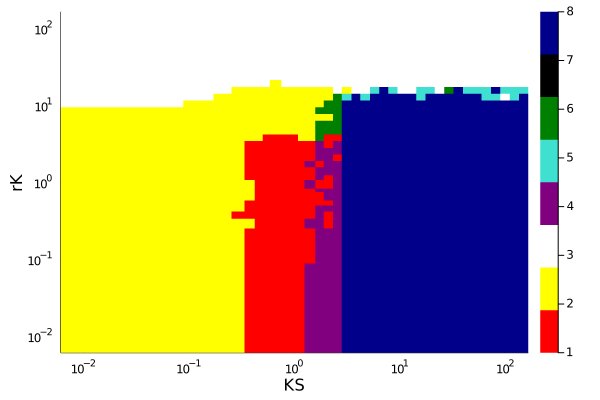

In [17]:
num_behaviors = zeros(Int64, size(behaviors)...)

sym2num = Dict(:oscillation => 1, :stochastic_pulsing => 2, :no_expression => 3,
    :stochastic_anti_pulsing => 4, :het_activation => 5, :stochastic_switching => 6,
    :undefined=> 7, :homo_activation => 8)
color_grad = cgrad([:red, :yellow, :white, :purple, :turquoise, :green, :black, :darkblue], categorical = true)

for i = 1:size(behaviors, 1)
    for j = 1:size(behaviors, 2)
        num_behaviors[i, j] = sym2num[behaviors[i, j]]
    end
end

heatmap(KS_vec, rK_vec, num_behaviors, c = color_grad, xaxis = :log, yaxis = :log,
    xlabel = "KS", ylabel = "rK")